In [1]:
# Import Libraries needed
import numpy as np
import glob
from PIL import Image
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import Model,optimizers
from tensorflow.keras.layers import Input, Dense, BatchNormalization, Reshape, Conv2DTranspose, Conv2D, LeakyReLU, Flatten, Dropout
from IPython import display
import os
import random
from tensorflow.python.client import device_lib

In [4]:
print(tf.__version__)

2.4.1


In [2]:
# Test the status of GPU
tf.test.is_gpu_available()
# Check the devices of GPU
device_lib.list_local_devices()

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 12500596823668344228, name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 15507165056
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 8832770602538251296
 physical_device_desc: "device: 0, name: Tesla V100-SXM2-16GB, pci bus id: 0000:00:04.0, compute capability: 7.0"]

In [3]:
# Build a connection with my Google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
# Copy the zipfile of preprocessed images and unzip it
!cp "/content/drive/MyDrive/Colab Notebooks/Processed_Imgs3.zip" .
!unzip -q Processed_Imgs3.zip
!rm Processed_Imgs3.zip

replace Processed_Imgs2/gallina/OIP-6S0q7VFLiRLS8SL6mVr7hAHaJU.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [5]:
# Enter the name of animals in the dataset
all_files=["cane","cavallo","elefante","farfalla","gallina","pecora","mucca","ragno","gatto","scoiattolo"]

# Define a function to read the images from the dataset
def read_images():
    images = []
    # Store the images in the form of array into the images list
    for files in all_files:
        for image_name in glob.glob("/content/Processed_Imgs2/"+files+"/*.png"):
            image = Image.open(image_name)
            image = np.asarray(image)
            images.append(image)
    
    # Randomly shuffle the sequence of images
    random.shuffle(images)
    
    # Formalize the array values to values from 0 to 1
    return np.asarray(images) / 255.

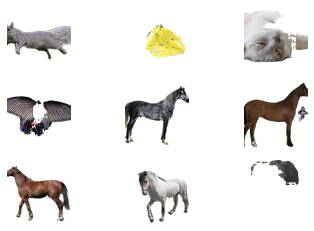

In [6]:
# Read the images from the dataset
train_set = read_images()

# Show 9 images
for i in range(9):
    plt.subplot(3,3, i + 1)
    plt.imshow(train_set[i])
    plt.axis('off')
plt.show()

In [7]:
# Define the loss function for the generator, the input is the probability of generated images are considered genuine
def loss_generator(prob):
    # Mean of log of prob of tensors
    return tf.math.negative(tf.math.reduce_mean(tf.math.log(prob)))

# Define the loss function for the discriminator
def loss_discriminator(p_real, p_fake):
    # The sub-loss to recognize real images as real
    loss_real = tf.math.negative(tf.math.reduce_mean(tf.math.log(p_real)))
    # The sub-loss to recognize fake images as fake
    loss_fake = tf.math.negative(tf.math.reduce_mean(tf.math.log(1 - p_fake)))
    # Total loss_function equals to the sum of two sub_loss
    return loss_real + loss_fake

# Define the CNN for Generator
def Generator(output_channels, noise_size):
    # Define the input with the noise
    X = Input(shape=noise_size)

    # Project the input noise to the size of 4x4
    Y = Dense(units=4*4*256)(X)
    # Add Leaky Relu for the activision of the network
    Y = LeakyReLU()(Y)
    # Add a batch normalization layer
    Y = BatchNormalization()(Y)
    # Reshape the input to 4*4*256
    Y = Reshape(target_shape=(4, 4, 256))(Y)

    # Amplify the input to 8x8
    # Use a deconvolution layer to transpose the convolution operation
    Y = Conv2DTranspose(filters=128, kernel_size=5, strides=2, padding='same', activation='relu')(Y)
    # Add a # Add a batch normalization layer
    Y = BatchNormalization()(Y)

    # Amplify the input to 16x16
    Y = Conv2DTranspose(filters=64, kernel_size=5, strides=2, padding='same', activation='relu')(Y)
    Y = BatchNormalization()(Y)

    # Amplify the input to 32x32
    Y = Conv2DTranspose(filters=32, kernel_size=5, strides=2, padding='same', activation='relu')(Y)
    Y = BatchNormalization()(Y)

    # Amplify the input to 64x64, use sigmoid as the activision function for the last layer
    Y = Conv2DTranspose(filters=output_channels, kernel_size=5, strides=2, padding='same', activation='sigmoid')(Y)

    # Construct the model
    model = Model(inputs=X, outputs=Y)

    return model

# Define a function to create the generator
def create_generator(channels, noise_size, learning_rate, beta_1):
    # Define the generator
    generator = Generator(output_channels=channels, noise_size=noise_size)
    # Use Adam as the optimizer of the training proccess, with a certain learning rate and hyperpara beta
    generator_optimizer = optimizers.Adam(lr=learning_rate, beta_1=beta_1)
    # Define the checkpoint to store model
    generator_checkpoint = tf.train.Checkpoint(optimizer=generator_optimizer, model=generator)

    return generator, generator_optimizer, generator_checkpoint

# Define the CNN for discriminator
def Discriminator(input_channels):
    # Define input arrays
    X = Input(shape=(64, 64, input_channels))

    # Project the input to 32x32
    # Add a convolutional layer
    Y = Conv2D(filters=32, kernel_size=5, strides=2, padding='same')(X)
    # Add Leaky Relu for the activision of the network
    Y = LeakyReLU()(Y)
    # Add a batch normalization layer
    Y = BatchNormalization()(Y)
    # Dropout 0.4 of tensors 
    Y = Dropout(0.4)(Y)

    # Project the input to 16x16
    Y = Conv2D(filters=64, kernel_size=5, strides=2, padding='same')(Y)
    Y = LeakyReLU()(Y)
    Y = BatchNormalization()(Y)
    Y = Dropout(0.4)(Y)

    # Project the input to 8x8
    Y = Conv2D(filters=128, kernel_size=5, strides=2, padding='same')(Y)
    Y = LeakyReLU()(Y)
    Y = BatchNormalization()(Y)
    Y = Dropout(0.4)(Y)

    # Project the input to 4x4
    Y = Conv2D(filters=256, kernel_size=5, strides=2, padding='same')(Y)
    Y = LeakyReLU()(Y)
    Y = BatchNormalization()(Y)
    Y = Dropout(0.4)(Y)

    # Flatten the last layer to boolen and make the classification
    Y = Flatten()(Y)
    Y = Dense(units=1, activation='sigmoid')(Y)

    # Set the final model
    model = Model(inputs=X, outputs=Y)

    return model

# Define a function to create the generator
def create_discriminator(channels, learning_rate, beta_1):
    # Define the discriminator
    discriminator = Discriminator(input_channels=channels)
    # Use Adam as the optimizer of the training proccess, with a certain learning rate and hyperpara beta
    discriminator_optimizer = optimizers.Adam(lr=learning_rate, beta_1=beta_1)
    # Define the checkpoint to store model
    discriminator_checkpoint = tf.train.Checkpoint(optimizer=discriminator_optimizer, model=discriminator)

    return discriminator, discriminator_optimizer, discriminator_checkpoint

In [8]:
# Define the function to train the model of DCGAN
def train_DCGAN(train_set, batch_size, epochs):
    # Set these variables globally
    global generator, generator_optimizer, generator_checkpoint, discriminator, discriminator_optimizer, discriminator_checkpoint, noise_size
    
    # Get the size of the train set
    train_size = train_set.shape[0]
    # Calculate the number of small batches
    num_batch = train_size // batch_size
    # Split the training set to small batches
    train_batches = np.split(train_set, [batch_size*i for i in range(1, num_batch)])

    # Get the prefixes for the checkpoints of the generator and discriminator
    generator_prefix = os.path.join('./generator', 'ckpt')
    discriminator_prefix = os.path.join('./discriminator', 'ckpt')

    # Generate lists to record costs of the generator and discriminator
    generator_costs = []
    discriminator_costs = []

    # Iterate the epochs
    for epoch in range(epochs):

        # Set the costs of the generator and discriminator to 0 fot each epoch 
        generator_cost = 0
        discriminator_cost = 0

        # Iterate small batchs
        for batch in train_batches:
            # Generate a random noise for the current batch
            noise = tf.random.normal([batch_size, noise_size])

            # Get the trainable variables for the loss functions of the generator and discriminator
            with tf.GradientTape() as generator_tape, tf.GradientTape() as discriminator_tape:
                
                # Generate fake images from noises with the generator
                fake_images = generator(noise, training=True)

                # Use the discriminator to calculate the probabilites of images for being fake and genuine
                p_fake = discriminator(fake_images, training=True)
                p_real = discriminator(batch, training=True)

                # Use functions to calculate the loss functions for the generator and discriminator
                generator_loss = loss_generator(p_fake)
                discriminator_loss = loss_discriminator(p_real, p_fake)

            # Calculate the gradients for generator 
            generator_Grads = generator_tape.gradient(generator_loss, generator.trainable_variables)
            # Imaplement gradient descend for generator 
            generator_optimizer.apply_gradients(zip(generator_Grads, generator.trainable_variables))
            
            # Calculate the gradients for discriminator
            discriminator_Grads = discriminator_tape.gradient(discriminator_loss, discriminator.trainable_variables)
            # Imaplement gradient descend for discriminator
            discriminator_optimizer.apply_gradients(zip(discriminator_Grads, discriminator.trainable_variables))

            # Record the costs of generator and discriminator at the end of every 10 epochs
            if (epoch + 1) % 10 == 0:
                # Not training with the input
                fake_images = generator(noise, training=False)
                p_fake = discriminator(fake_images, training=False)
                p_real = discriminator(batch, training=False)
                # Take the mean of genertor cost of each batch
                generator_cost += loss_generator(p_fake).numpy() / num_batch
                # Take the mean of discriminator cost of each batch
                discriminator_cost += loss_discriminator(p_real, p_fake).numpy() / num_batch
        # Print the end of a certain epoch
        print('Epoch: {}'.format(epoch+1),'Generator loss: {}'.format(generator_loss),'Discriminator loss: {}'.format(discriminator_loss))
       
        # Save the checkpoint every 10 epochs
        if (epoch + 1) % 10 == 0:
            # Save the checkpoint for the generator
            generator_checkpoint.save(file_prefix=generator_prefix)
            # Save the checkpoint for the discriminator
            discriminator_checkpoint.save(file_prefix=discriminator_prefix)
            
            # Append the generator costs
            generator_costs.append(generator_cost)
            # Append the discriminator costs
            discriminator_costs.append(discriminator_cost)
            
            # display.clear_output(wait=True)

            # Randomly generate 9 images with the current model
            noise = tf.random.normal([9, noise_size])
            predicted_image = generator(noise, training=False)
            fig = plt.figure(figsize=(10, 10))

            # Plot the 9 images
            for i in range(9):
                plt.subplot(3, 3, i + 1)
                plt.imshow(predicted_image[i])
                plt.axis('off')

            # Save the 9 Images
            plt.savefig('epoch{:04d}.png'.format(epoch+1))
            plt.show()

    # plot the changing curves of the generator and discriminator
    plt.plot(np.squeeze(generator_costs))
    plt.plot(np.squeeze(discriminator_costs))
    plt.show()


Epoch: 1 Generator loss: 7.510873794555664 Discriminator loss: 0.017981331795454025
Epoch: 2 Generator loss: 8.47311019897461 Discriminator loss: 0.014973524957895279
Epoch: 3 Generator loss: 6.748690605163574 Discriminator loss: 0.03305835276842117
Epoch: 4 Generator loss: 7.082024097442627 Discriminator loss: 0.05528745800256729
Epoch: 5 Generator loss: 5.094315052032471 Discriminator loss: 0.15197235345840454
Epoch: 6 Generator loss: 4.190240859985352 Discriminator loss: 0.1488039791584015
Epoch: 7 Generator loss: 2.6438612937927246 Discriminator loss: 0.40831518173217773
Epoch: 8 Generator loss: 3.2310802936553955 Discriminator loss: 0.4646661877632141
Epoch: 9 Generator loss: 2.3719358444213867 Discriminator loss: 0.4991456866264343
Epoch: 10 Generator loss: 3.2999157905578613 Discriminator loss: 0.44534581899642944


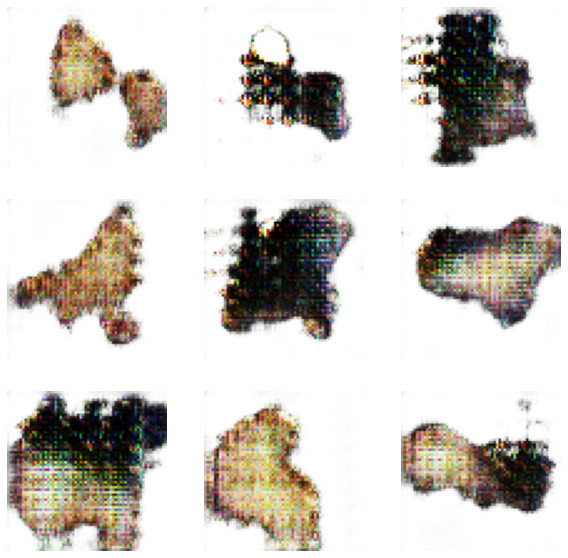

Epoch: 11 Generator loss: 1.3719807863235474 Discriminator loss: 0.8754843473434448
Epoch: 12 Generator loss: 2.980381488800049 Discriminator loss: 0.4568351209163666
Epoch: 13 Generator loss: 2.3514046669006348 Discriminator loss: 0.5444323420524597
Epoch: 14 Generator loss: 4.343400478363037 Discriminator loss: 0.5399721264839172
Epoch: 15 Generator loss: 2.7932889461517334 Discriminator loss: 0.4735322594642639
Epoch: 16 Generator loss: 3.064016342163086 Discriminator loss: 0.2626141905784607
Epoch: 17 Generator loss: 1.0275825262069702 Discriminator loss: 0.7969101667404175
Epoch: 18 Generator loss: 3.980999708175659 Discriminator loss: 0.3981417417526245
Epoch: 19 Generator loss: 2.549067497253418 Discriminator loss: 0.668635368347168
Epoch: 20 Generator loss: 2.951073408126831 Discriminator loss: 0.47271186113357544


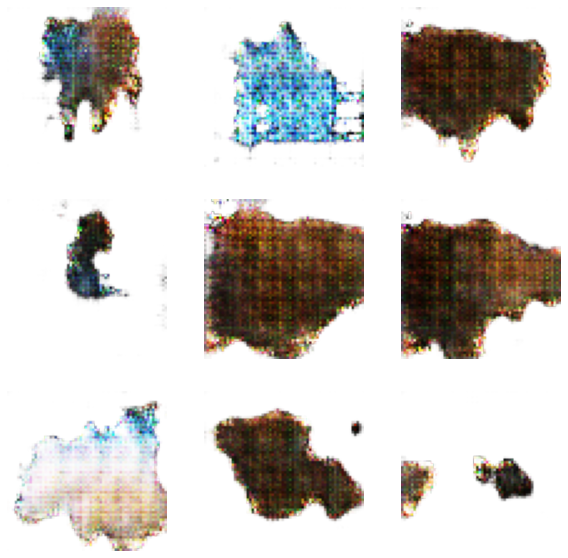

Epoch: 21 Generator loss: 1.70200514793396 Discriminator loss: 0.6268787384033203
Epoch: 22 Generator loss: 1.2770384550094604 Discriminator loss: 0.772018313407898
Epoch: 23 Generator loss: 1.9077304601669312 Discriminator loss: 0.6622608304023743
Epoch: 24 Generator loss: 3.267838954925537 Discriminator loss: 0.6086073517799377
Epoch: 25 Generator loss: 1.111131191253662 Discriminator loss: 0.7676489353179932
Epoch: 26 Generator loss: 1.061944842338562 Discriminator loss: 0.8258435726165771
Epoch: 27 Generator loss: 2.3351762294769287 Discriminator loss: 0.5930012464523315
Epoch: 28 Generator loss: 2.6078150272369385 Discriminator loss: 0.4984332025051117
Epoch: 29 Generator loss: 1.3342036008834839 Discriminator loss: 0.6752385497093201
Epoch: 30 Generator loss: 2.360840082168579 Discriminator loss: 0.40450578927993774


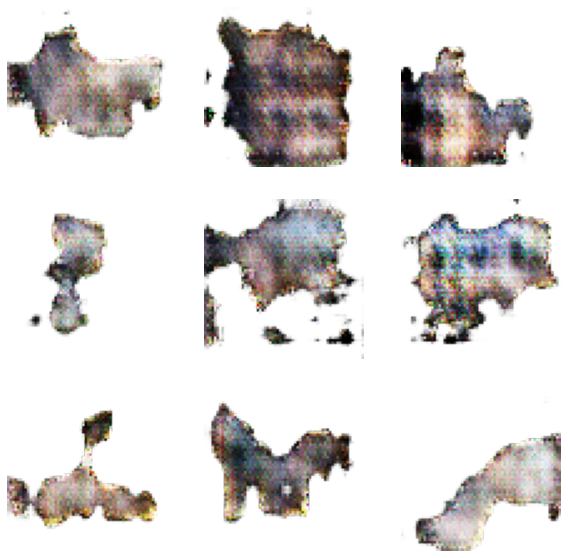

Epoch: 31 Generator loss: 0.7311230301856995 Discriminator loss: 1.0667459964752197
Epoch: 32 Generator loss: 0.1962115466594696 Discriminator loss: 2.4294815063476562
Epoch: 33 Generator loss: 1.6262941360473633 Discriminator loss: 0.5386450290679932
Epoch: 34 Generator loss: 1.1287344694137573 Discriminator loss: 0.8430004715919495
Epoch: 35 Generator loss: 1.735082983970642 Discriminator loss: 0.7477508783340454
Epoch: 36 Generator loss: 2.935499668121338 Discriminator loss: 0.8475676774978638
Epoch: 37 Generator loss: 1.430607557296753 Discriminator loss: 0.6206001043319702
Epoch: 38 Generator loss: 1.2464454174041748 Discriminator loss: 0.7551364302635193
Epoch: 39 Generator loss: 2.860801935195923 Discriminator loss: 0.8121892213821411
Epoch: 40 Generator loss: 1.3847057819366455 Discriminator loss: 0.9951403141021729


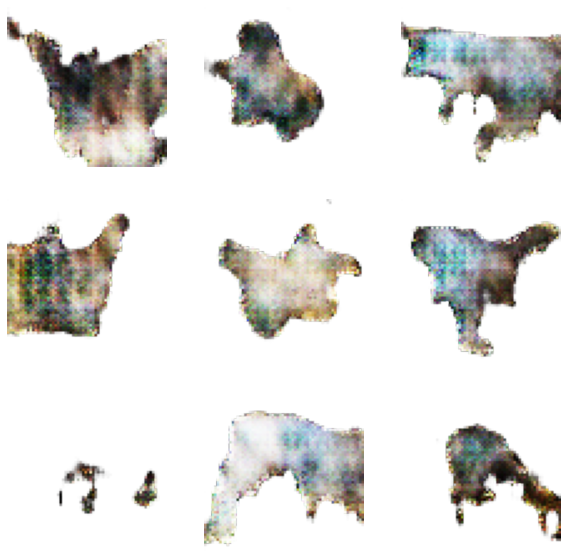

Epoch: 41 Generator loss: 0.7050085663795471 Discriminator loss: 1.1079742908477783
Epoch: 42 Generator loss: 1.0244964361190796 Discriminator loss: 0.8102951049804688
Epoch: 43 Generator loss: 0.7840107679367065 Discriminator loss: 1.2061131000518799
Epoch: 44 Generator loss: 1.3388447761535645 Discriminator loss: 0.8363248109817505
Epoch: 45 Generator loss: 2.83370304107666 Discriminator loss: 0.9416379332542419
Epoch: 46 Generator loss: 0.9921891093254089 Discriminator loss: 0.9174094200134277
Epoch: 47 Generator loss: 1.9286426305770874 Discriminator loss: 0.5661189556121826
Epoch: 48 Generator loss: 2.603686571121216 Discriminator loss: 0.5893252491950989
Epoch: 49 Generator loss: 3.003941535949707 Discriminator loss: 0.7238012552261353
Epoch: 50 Generator loss: 2.4445865154266357 Discriminator loss: 0.39227160811424255


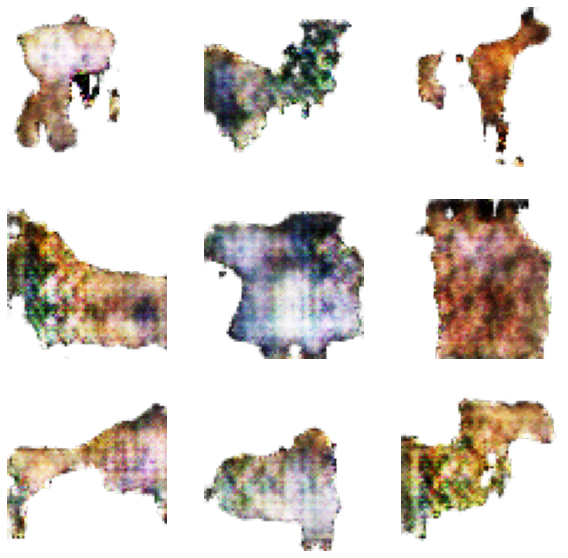

Epoch: 51 Generator loss: 1.3758352994918823 Discriminator loss: 0.7492536902427673
Epoch: 52 Generator loss: 0.7200764417648315 Discriminator loss: 1.0531738996505737
Epoch: 53 Generator loss: 1.9693619012832642 Discriminator loss: 0.5725122690200806
Epoch: 54 Generator loss: 0.4279494881629944 Discriminator loss: 1.6837812662124634
Epoch: 55 Generator loss: 3.5355384349823 Discriminator loss: 1.3444260358810425
Epoch: 56 Generator loss: 2.2106833457946777 Discriminator loss: 0.5125647783279419
Epoch: 57 Generator loss: 1.4249825477600098 Discriminator loss: 1.0138616561889648
Epoch: 58 Generator loss: 0.8230748772621155 Discriminator loss: 1.0507640838623047
Epoch: 59 Generator loss: 1.1711541414260864 Discriminator loss: 0.8932585716247559
Epoch: 60 Generator loss: 0.4580012559890747 Discriminator loss: 1.4216326475143433


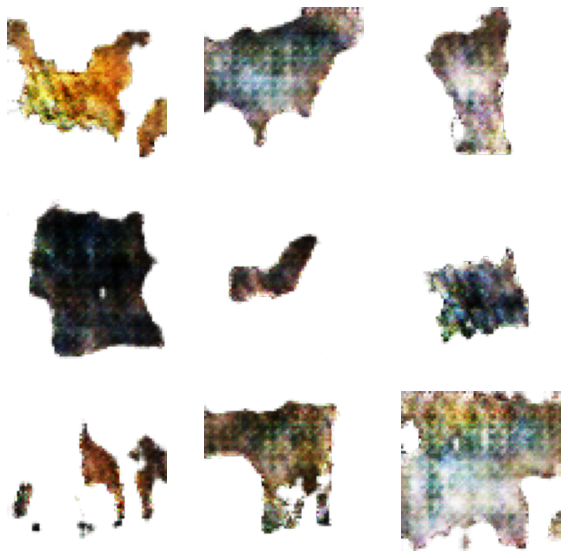

Epoch: 61 Generator loss: 0.3077271580696106 Discriminator loss: 1.9464792013168335
Epoch: 62 Generator loss: 2.9825186729431152 Discriminator loss: 0.8312011957168579
Epoch: 63 Generator loss: 1.252851963043213 Discriminator loss: 0.6717383861541748
Epoch: 64 Generator loss: 1.6743583679199219 Discriminator loss: 0.4566720128059387
Epoch: 65 Generator loss: 0.9503943920135498 Discriminator loss: 0.9074892401695251
Epoch: 66 Generator loss: 2.595515251159668 Discriminator loss: 0.37870728969573975
Epoch: 67 Generator loss: 0.5937702059745789 Discriminator loss: 1.3235559463500977
Epoch: 68 Generator loss: 0.7676615118980408 Discriminator loss: 1.0391323566436768
Epoch: 69 Generator loss: 1.8951148986816406 Discriminator loss: 0.73893803358078
Epoch: 70 Generator loss: 0.11859716475009918 Discriminator loss: 2.778869390487671


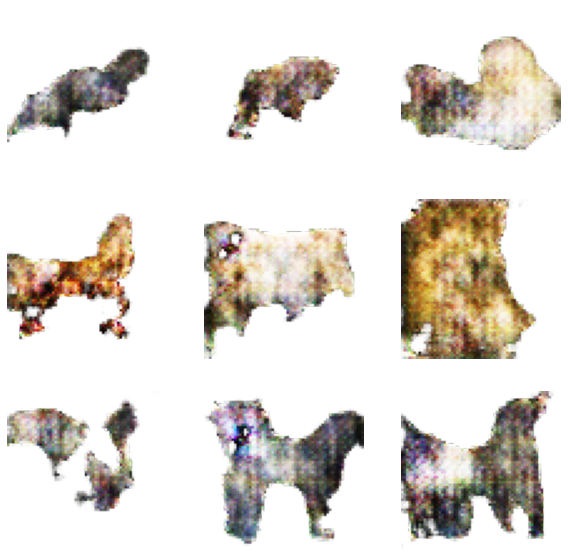

Epoch: 71 Generator loss: 0.6485939025878906 Discriminator loss: 1.220001459121704
Epoch: 72 Generator loss: 2.802865505218506 Discriminator loss: 0.4126201570034027
Epoch: 73 Generator loss: 2.2208971977233887 Discriminator loss: 0.471771240234375
Epoch: 74 Generator loss: 0.4764171540737152 Discriminator loss: 1.4192018508911133
Epoch: 75 Generator loss: 0.9051891565322876 Discriminator loss: 0.8676261901855469
Epoch: 76 Generator loss: 1.1142834424972534 Discriminator loss: 0.7362779378890991
Epoch: 77 Generator loss: 1.6152091026306152 Discriminator loss: 0.530569314956665
Epoch: 78 Generator loss: 3.6426758766174316 Discriminator loss: 0.21038955450057983
Epoch: 79 Generator loss: 1.3398677110671997 Discriminator loss: 0.5558638572692871
Epoch: 80 Generator loss: 2.6126558780670166 Discriminator loss: 0.3826393783092499


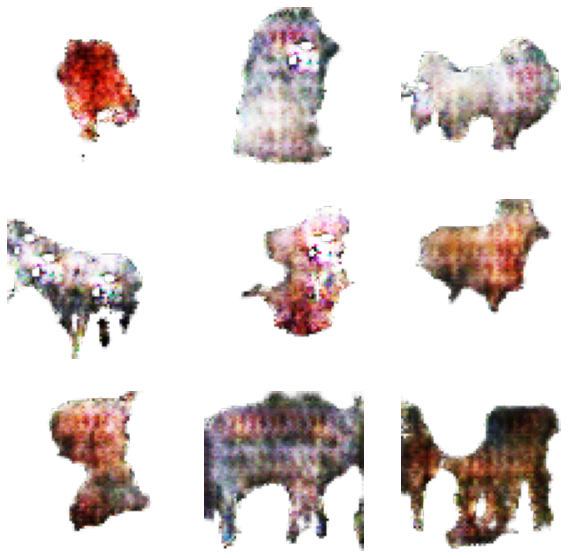

Epoch: 81 Generator loss: 2.6219100952148438 Discriminator loss: 0.40099743008613586
Epoch: 82 Generator loss: 3.6199910640716553 Discriminator loss: 0.21940773725509644
Epoch: 83 Generator loss: 3.928311824798584 Discriminator loss: 0.2875394821166992
Epoch: 84 Generator loss: 1.0919947624206543 Discriminator loss: 0.8015381693840027
Epoch: 85 Generator loss: 2.8042938709259033 Discriminator loss: 0.5042931437492371
Epoch: 86 Generator loss: 0.8161616325378418 Discriminator loss: 0.9163725972175598
Epoch: 87 Generator loss: 1.8877661228179932 Discriminator loss: 0.378486692905426
Epoch: 88 Generator loss: 0.7227838039398193 Discriminator loss: 1.0995858907699585
Epoch: 89 Generator loss: 1.4471995830535889 Discriminator loss: 0.49929705262184143
Epoch: 90 Generator loss: 1.260427713394165 Discriminator loss: 0.6061297059059143


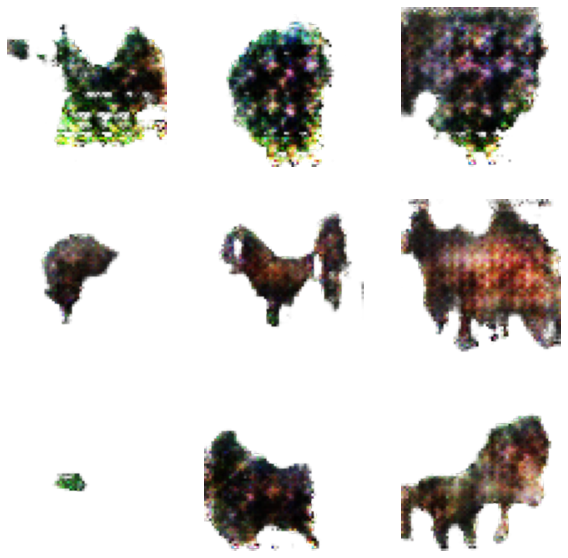

Epoch: 91 Generator loss: 2.5002799034118652 Discriminator loss: 0.4420705735683441
Epoch: 92 Generator loss: 2.884831190109253 Discriminator loss: 0.38686609268188477
Epoch: 93 Generator loss: 2.353034019470215 Discriminator loss: 0.37273797392845154
Epoch: 94 Generator loss: 2.1346242427825928 Discriminator loss: 0.33797478675842285
Epoch: 95 Generator loss: 1.8361386060714722 Discriminator loss: 0.37644708156585693
Epoch: 96 Generator loss: 3.8665146827697754 Discriminator loss: 0.7949908971786499
Epoch: 97 Generator loss: 4.889322280883789 Discriminator loss: 0.3544375002384186
Epoch: 98 Generator loss: 1.1817972660064697 Discriminator loss: 0.9379655122756958
Epoch: 99 Generator loss: 2.3914926052093506 Discriminator loss: 0.26139792799949646
Epoch: 100 Generator loss: 2.9456496238708496 Discriminator loss: 0.44998812675476074


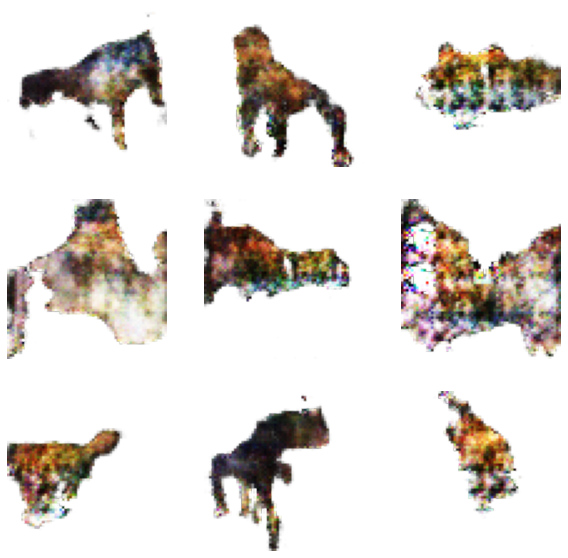

Epoch: 101 Generator loss: 2.0762603282928467 Discriminator loss: 0.3301733434200287
Epoch: 102 Generator loss: 2.1474215984344482 Discriminator loss: 0.35011419653892517
Epoch: 103 Generator loss: 0.4382716119289398 Discriminator loss: 1.4751360416412354
Epoch: 104 Generator loss: 6.2512359619140625 Discriminator loss: 1.7215839624404907
Epoch: 105 Generator loss: 1.8687647581100464 Discriminator loss: 0.3521292507648468
Epoch: 106 Generator loss: 3.2652621269226074 Discriminator loss: 0.15134072303771973
Epoch: 107 Generator loss: 2.898547887802124 Discriminator loss: 0.472286581993103
Epoch: 108 Generator loss: 4.093610763549805 Discriminator loss: 0.20256300270557404
Epoch: 109 Generator loss: 2.06929087638855 Discriminator loss: 0.3200172781944275
Epoch: 110 Generator loss: 2.538696527481079 Discriminator loss: 0.37749171257019043


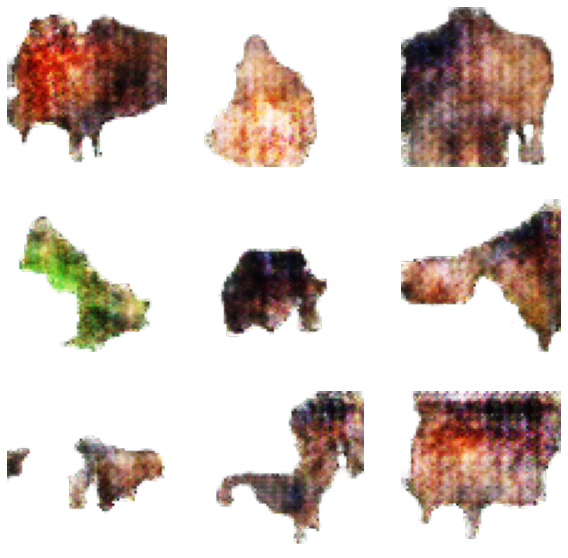

Epoch: 111 Generator loss: 4.139569282531738 Discriminator loss: 0.34214895963668823
Epoch: 112 Generator loss: 0.11175470054149628 Discriminator loss: 3.098299741744995
Epoch: 113 Generator loss: 2.0255136489868164 Discriminator loss: 0.3612443208694458
Epoch: 114 Generator loss: 4.040515899658203 Discriminator loss: 0.23638105392456055
Epoch: 115 Generator loss: 4.513642311096191 Discriminator loss: 0.2471308559179306
Epoch: 116 Generator loss: 1.2415598630905151 Discriminator loss: 0.7985467910766602
Epoch: 117 Generator loss: 0.017019303515553474 Discriminator loss: 5.020176887512207
Epoch: 118 Generator loss: 3.804943561553955 Discriminator loss: 0.22305262088775635
Epoch: 119 Generator loss: 1.1015326976776123 Discriminator loss: 0.8335492610931396
Epoch: 120 Generator loss: 1.3690011501312256 Discriminator loss: 0.5627400279045105


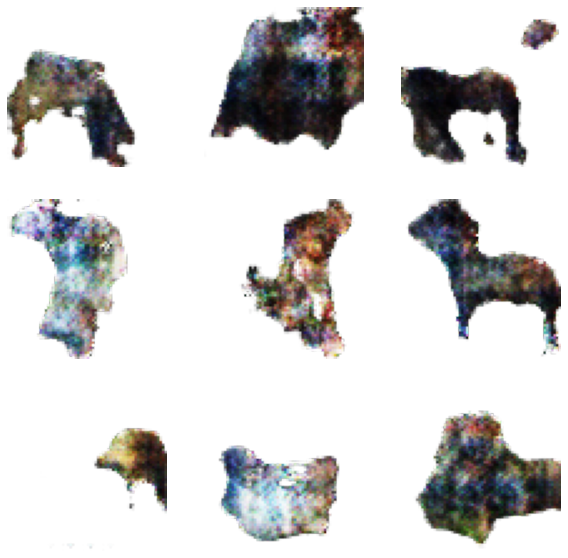

Epoch: 121 Generator loss: 4.492998123168945 Discriminator loss: 0.7848973870277405
Epoch: 122 Generator loss: 3.190361738204956 Discriminator loss: 0.25965702533721924
Epoch: 123 Generator loss: 1.4617562294006348 Discriminator loss: 0.5181055068969727
Epoch: 124 Generator loss: 3.0231456756591797 Discriminator loss: 0.15804576873779297
Epoch: 125 Generator loss: 4.508142471313477 Discriminator loss: 0.7834733128547668
Epoch: 126 Generator loss: 5.330207347869873 Discriminator loss: 0.619736909866333
Epoch: 127 Generator loss: 3.068878173828125 Discriminator loss: 0.18532666563987732
Epoch: 128 Generator loss: 4.231097221374512 Discriminator loss: 0.09898265451192856
Epoch: 129 Generator loss: 2.8471579551696777 Discriminator loss: 0.26924929022789
Epoch: 130 Generator loss: 1.1205066442489624 Discriminator loss: 0.7434970140457153


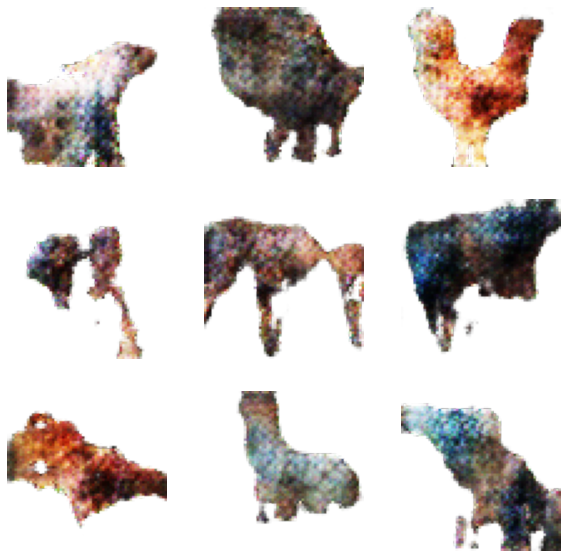

Epoch: 131 Generator loss: 2.818406105041504 Discriminator loss: 0.17232438921928406
Epoch: 132 Generator loss: 2.751039743423462 Discriminator loss: 0.3079298734664917
Epoch: 133 Generator loss: 3.406724214553833 Discriminator loss: 0.3606508672237396
Epoch: 134 Generator loss: 1.9717965126037598 Discriminator loss: 0.3034727871417999
Epoch: 135 Generator loss: 2.4545371532440186 Discriminator loss: 0.32403141260147095
Epoch: 136 Generator loss: 0.6740207672119141 Discriminator loss: 1.0987497568130493
Epoch: 137 Generator loss: 2.699444055557251 Discriminator loss: 0.21938186883926392
Epoch: 138 Generator loss: 7.303183555603027 Discriminator loss: 0.6270096302032471
Epoch: 139 Generator loss: 3.4754645824432373 Discriminator loss: 0.3552487790584564
Epoch: 140 Generator loss: 1.2554409503936768 Discriminator loss: 0.6701611876487732


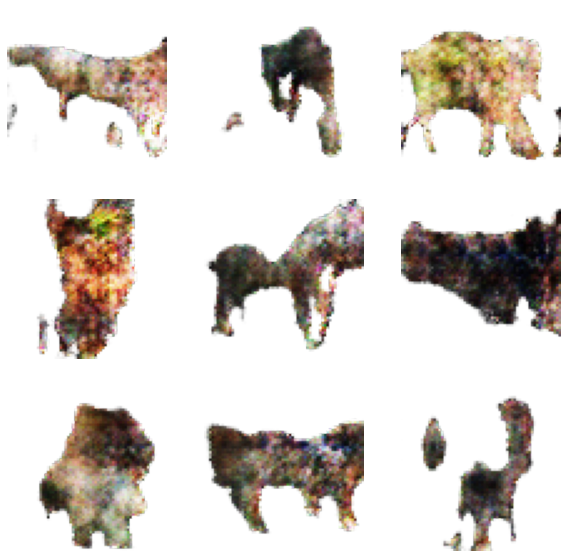

Epoch: 141 Generator loss: 2.4160141944885254 Discriminator loss: 0.25928762555122375
Epoch: 142 Generator loss: 2.0250563621520996 Discriminator loss: 0.31010472774505615
Epoch: 143 Generator loss: 4.870773792266846 Discriminator loss: 0.21633069217205048
Epoch: 144 Generator loss: 4.547301769256592 Discriminator loss: 0.13161936402320862
Epoch: 145 Generator loss: 6.338487148284912 Discriminator loss: 1.017962098121643
Epoch: 146 Generator loss: 5.040137767791748 Discriminator loss: 0.591001033782959
Epoch: 147 Generator loss: 3.1731767654418945 Discriminator loss: 0.1877484917640686
Epoch: 148 Generator loss: 0.5482473969459534 Discriminator loss: 1.3407952785491943
Epoch: 149 Generator loss: 6.668973445892334 Discriminator loss: 0.3965159058570862
Epoch: 150 Generator loss: 2.7977445125579834 Discriminator loss: 0.2078978270292282


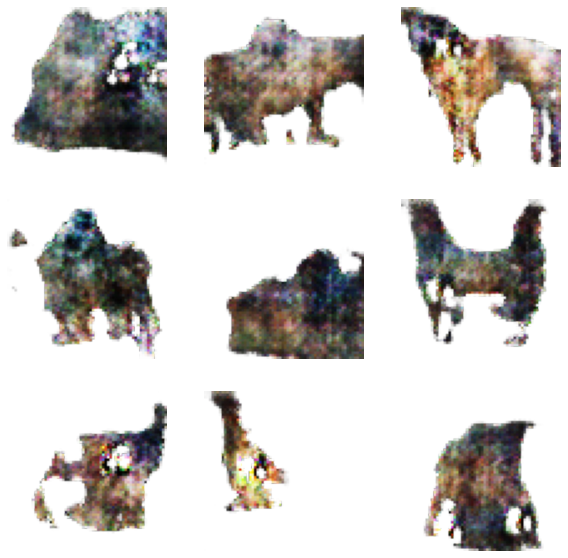

Epoch: 151 Generator loss: 4.513601303100586 Discriminator loss: 0.08158770948648453
Epoch: 152 Generator loss: 2.7437987327575684 Discriminator loss: 0.2901606559753418
Epoch: 153 Generator loss: 7.434467315673828 Discriminator loss: 0.6801766157150269
Epoch: 154 Generator loss: 3.1502301692962646 Discriminator loss: 0.2084318846464157
Epoch: 155 Generator loss: 7.362518310546875 Discriminator loss: 0.119429811835289
Epoch: 156 Generator loss: 6.310049057006836 Discriminator loss: 0.3588653802871704
Epoch: 157 Generator loss: 8.121732711791992 Discriminator loss: 0.8796405792236328
Epoch: 158 Generator loss: 1.970575213432312 Discriminator loss: 0.3492073714733124
Epoch: 159 Generator loss: 7.70280647277832 Discriminator loss: 0.7229762673377991
Epoch: 160 Generator loss: 2.3101930618286133 Discriminator loss: 0.22771866619586945


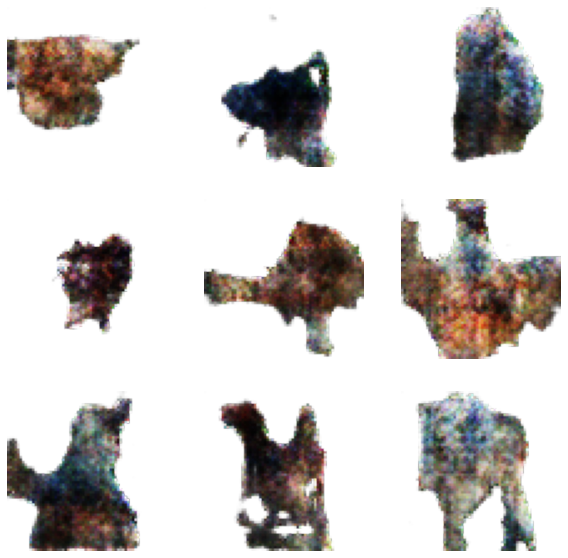

Epoch: 161 Generator loss: 1.3376818895339966 Discriminator loss: 0.6142281293869019
Epoch: 162 Generator loss: 3.337812900543213 Discriminator loss: 0.10188206285238266
Epoch: 163 Generator loss: 5.615250110626221 Discriminator loss: 0.04154497757554054
Epoch: 164 Generator loss: 4.653076648712158 Discriminator loss: 0.17597712576389313
Epoch: 165 Generator loss: 5.391824245452881 Discriminator loss: 0.06414856761693954
Epoch: 166 Generator loss: 0.710008978843689 Discriminator loss: 1.2520735263824463
Epoch: 167 Generator loss: 4.216632843017578 Discriminator loss: 0.03778761625289917
Epoch: 168 Generator loss: 4.671385288238525 Discriminator loss: 0.18296808004379272
Epoch: 169 Generator loss: 2.9753198623657227 Discriminator loss: 0.20198659598827362
Epoch: 170 Generator loss: 2.2352089881896973 Discriminator loss: 0.25452861189842224


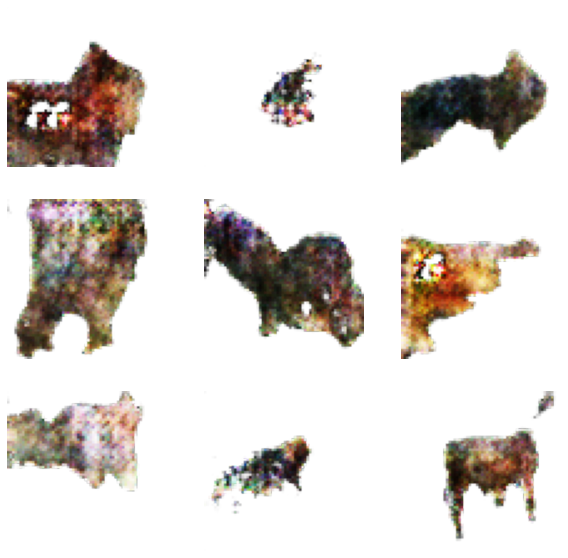

Epoch: 171 Generator loss: 1.3168530464172363 Discriminator loss: 0.5598809123039246
Epoch: 172 Generator loss: 3.4195425510406494 Discriminator loss: 0.12226984649896622
Epoch: 173 Generator loss: 2.7527472972869873 Discriminator loss: 0.18768441677093506
Epoch: 174 Generator loss: 8.521141052246094 Discriminator loss: 0.6201949119567871
Epoch: 175 Generator loss: 3.099297285079956 Discriminator loss: 0.137101411819458
Epoch: 176 Generator loss: 6.264179229736328 Discriminator loss: 0.2255835086107254
Epoch: 177 Generator loss: 4.48511266708374 Discriminator loss: 0.04072301834821701
Epoch: 178 Generator loss: 4.4384989738464355 Discriminator loss: 0.07549291104078293
Epoch: 179 Generator loss: 1.2251054048538208 Discriminator loss: 0.651460587978363
Epoch: 180 Generator loss: 6.024580001831055 Discriminator loss: 0.10183027386665344


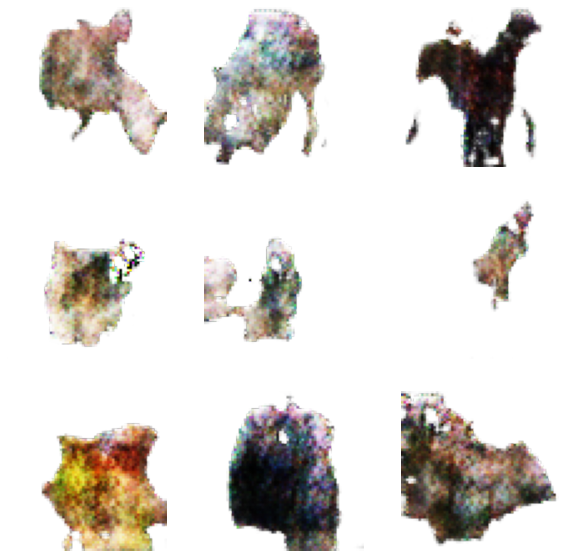

Epoch: 181 Generator loss: 3.881899118423462 Discriminator loss: 0.06497054547071457
Epoch: 182 Generator loss: 2.191375970840454 Discriminator loss: 0.22087885439395905
Epoch: 183 Generator loss: 4.808159351348877 Discriminator loss: 0.23273658752441406
Epoch: 184 Generator loss: 7.760830879211426 Discriminator loss: 0.0749736875295639
Epoch: 185 Generator loss: 2.4110469818115234 Discriminator loss: 0.2955084443092346
Epoch: 186 Generator loss: 4.94593620300293 Discriminator loss: 0.06943763047456741
Epoch: 187 Generator loss: 4.236518859863281 Discriminator loss: 0.18134871125221252
Epoch: 188 Generator loss: 3.3443033695220947 Discriminator loss: 0.10499688982963562
Epoch: 189 Generator loss: 5.68160343170166 Discriminator loss: 0.09494588524103165
Epoch: 190 Generator loss: 4.475513458251953 Discriminator loss: 0.08789802342653275


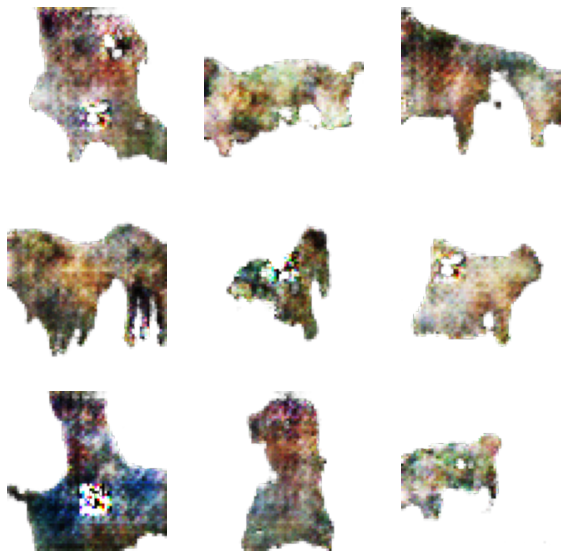

Epoch: 191 Generator loss: 1.4414267539978027 Discriminator loss: 0.5375086069107056
Epoch: 192 Generator loss: 2.497802257537842 Discriminator loss: 0.2060512751340866
Epoch: 193 Generator loss: 4.622986316680908 Discriminator loss: 0.2809949815273285
Epoch: 194 Generator loss: 0.9849027395248413 Discriminator loss: 0.9310991168022156
Epoch: 195 Generator loss: 3.1249845027923584 Discriminator loss: 0.11739929020404816
Epoch: 196 Generator loss: 8.234540939331055 Discriminator loss: 1.1224995851516724
Epoch: 197 Generator loss: 4.679902076721191 Discriminator loss: 0.08129362016916275
Epoch: 198 Generator loss: 3.5705032348632812 Discriminator loss: 0.08360422402620316
Epoch: 199 Generator loss: 4.8767008781433105 Discriminator loss: 0.12280718237161636
Epoch: 200 Generator loss: 3.649548053741455 Discriminator loss: 0.11832909286022186


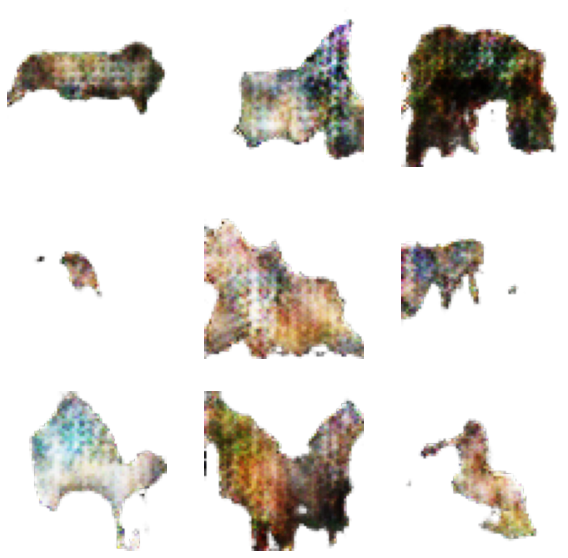

Epoch: 201 Generator loss: 5.835146903991699 Discriminator loss: 0.06462696194648743
Epoch: 202 Generator loss: 3.8634369373321533 Discriminator loss: 0.06958118826150894
Epoch: 203 Generator loss: 13.098947525024414 Discriminator loss: 3.4724135398864746
Epoch: 204 Generator loss: 3.0604071617126465 Discriminator loss: 0.6017822027206421
Epoch: 205 Generator loss: 0.22546149790287018 Discriminator loss: 2.4411802291870117
Epoch: 206 Generator loss: 2.881061315536499 Discriminator loss: 0.154052734375
Epoch: 207 Generator loss: 5.023209095001221 Discriminator loss: 0.15859273076057434
Epoch: 208 Generator loss: 0.957659900188446 Discriminator loss: 0.8869684338569641
Epoch: 209 Generator loss: 5.361822605133057 Discriminator loss: 0.057198747992515564
Epoch: 210 Generator loss: 4.497773170471191 Discriminator loss: 0.29987162351608276


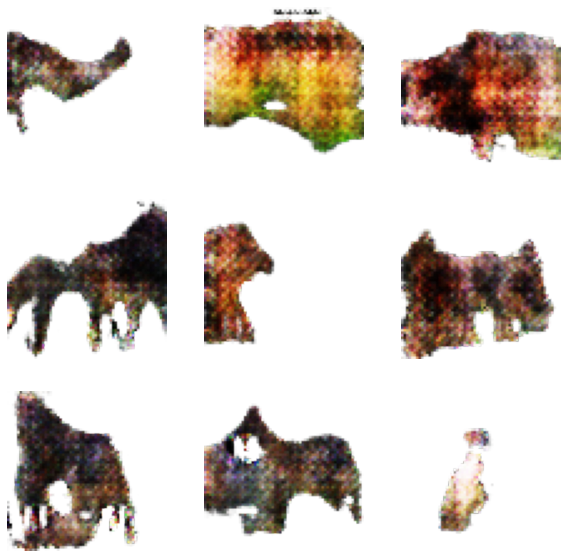

Epoch: 211 Generator loss: 1.649656057357788 Discriminator loss: 0.427272230386734
Epoch: 212 Generator loss: 2.047971487045288 Discriminator loss: 0.2643006443977356
Epoch: 213 Generator loss: 5.807391166687012 Discriminator loss: 0.3207648992538452
Epoch: 214 Generator loss: 5.95107364654541 Discriminator loss: 0.18552102148532867
Epoch: 215 Generator loss: 10.307760238647461 Discriminator loss: 0.7908059358596802
Epoch: 216 Generator loss: 3.0457472801208496 Discriminator loss: 0.13405686616897583
Epoch: 217 Generator loss: 3.5331859588623047 Discriminator loss: 0.09248004853725433
Epoch: 218 Generator loss: 1.6794064044952393 Discriminator loss: 0.433387815952301
Epoch: 219 Generator loss: 3.6592812538146973 Discriminator loss: 0.06915958225727081
Epoch: 220 Generator loss: 4.986124038696289 Discriminator loss: 0.11125792562961578


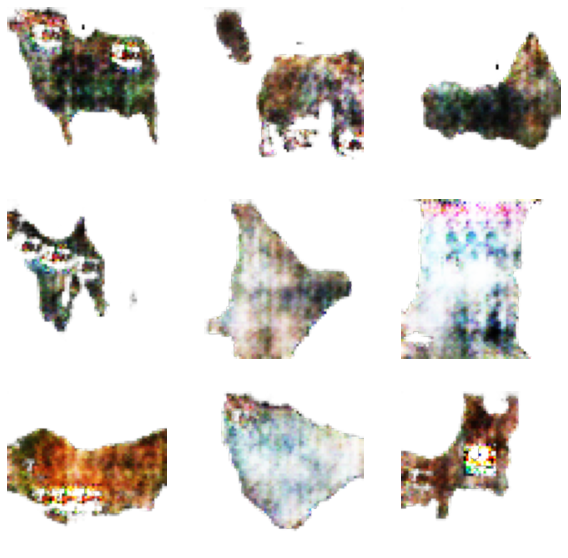

Epoch: 221 Generator loss: 0.6158205270767212 Discriminator loss: 1.4305862188339233
Epoch: 222 Generator loss: 5.832818508148193 Discriminator loss: 0.06035930663347244
Epoch: 223 Generator loss: 1.066861629486084 Discriminator loss: 0.8125445246696472
Epoch: 224 Generator loss: 2.9584460258483887 Discriminator loss: 0.1544639766216278
Epoch: 225 Generator loss: 7.191964149475098 Discriminator loss: 0.6974822878837585
Epoch: 226 Generator loss: 6.305556774139404 Discriminator loss: 0.1352178305387497
Epoch: 227 Generator loss: 5.471634387969971 Discriminator loss: 0.24235333502292633
Epoch: 228 Generator loss: 2.8286969661712646 Discriminator loss: 0.1272326111793518
Epoch: 229 Generator loss: 5.99183464050293 Discriminator loss: 0.038399480283260345
Epoch: 230 Generator loss: 3.461111545562744 Discriminator loss: 0.10447943210601807


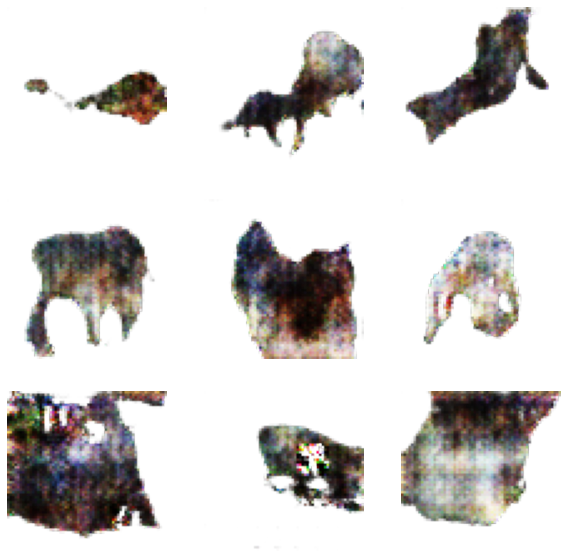

Epoch: 231 Generator loss: 4.836808681488037 Discriminator loss: 0.16792526841163635
Epoch: 232 Generator loss: 3.7862069606781006 Discriminator loss: 0.0707487165927887
Epoch: 233 Generator loss: 3.339827299118042 Discriminator loss: 0.07845483720302582
Epoch: 234 Generator loss: 1.1337968111038208 Discriminator loss: 0.775174081325531
Epoch: 235 Generator loss: 6.895052909851074 Discriminator loss: 0.16705353558063507
Epoch: 236 Generator loss: 5.55068826675415 Discriminator loss: 0.13183757662773132
Epoch: 237 Generator loss: 4.661290168762207 Discriminator loss: 0.04724418371915817
Epoch: 238 Generator loss: 4.073801040649414 Discriminator loss: 0.058912359178066254
Epoch: 239 Generator loss: 2.310317039489746 Discriminator loss: 0.2591046988964081
Epoch: 240 Generator loss: 4.8520827293396 Discriminator loss: 0.11734510213136673


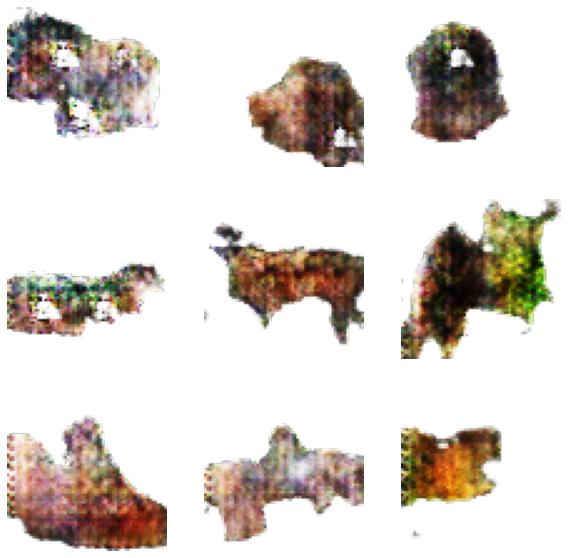

Epoch: 241 Generator loss: 1.466133713722229 Discriminator loss: 0.5240572690963745
Epoch: 242 Generator loss: 6.820975303649902 Discriminator loss: 0.114137202501297
Epoch: 243 Generator loss: 4.401148796081543 Discriminator loss: 0.08784447610378265
Epoch: 244 Generator loss: 2.2944796085357666 Discriminator loss: 0.2385755330324173
Epoch: 245 Generator loss: 2.566117525100708 Discriminator loss: 0.177401602268219
Epoch: 246 Generator loss: 7.599707126617432 Discriminator loss: 0.3558756709098816
Epoch: 247 Generator loss: 1.9504319429397583 Discriminator loss: 0.3265339434146881
Epoch: 248 Generator loss: 5.714540481567383 Discriminator loss: 0.2019532173871994
Epoch: 249 Generator loss: 0.6123176217079163 Discriminator loss: 1.2207539081573486
Epoch: 250 Generator loss: 2.5042924880981445 Discriminator loss: 0.22776702046394348


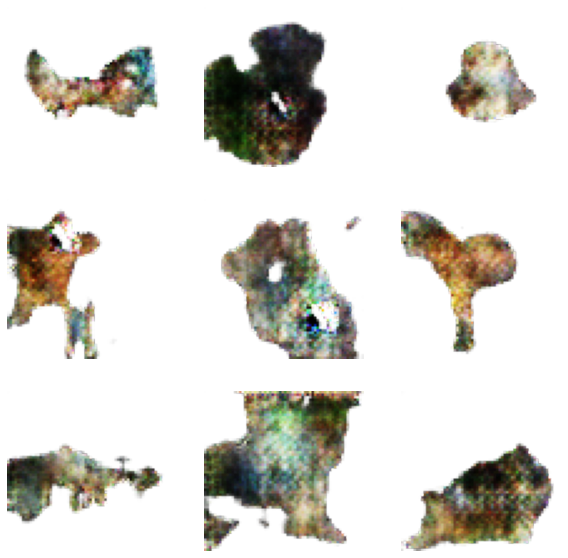

Epoch: 251 Generator loss: 3.5196752548217773 Discriminator loss: 0.07211349159479141
Epoch: 252 Generator loss: 4.655462741851807 Discriminator loss: 0.02861272543668747
Epoch: 253 Generator loss: 4.886907577514648 Discriminator loss: 0.23951971530914307
Epoch: 254 Generator loss: 0.1848066747188568 Discriminator loss: 2.3648247718811035
Epoch: 255 Generator loss: 3.568808078765869 Discriminator loss: 0.08298960328102112
Epoch: 256 Generator loss: 9.771139144897461 Discriminator loss: 0.44822871685028076
Epoch: 257 Generator loss: 6.699785232543945 Discriminator loss: 0.6344901323318481
Epoch: 258 Generator loss: 4.458312511444092 Discriminator loss: 0.05070067569613457
Epoch: 259 Generator loss: 5.886574745178223 Discriminator loss: 0.03187893331050873
Epoch: 260 Generator loss: 4.172606945037842 Discriminator loss: 0.12416623532772064


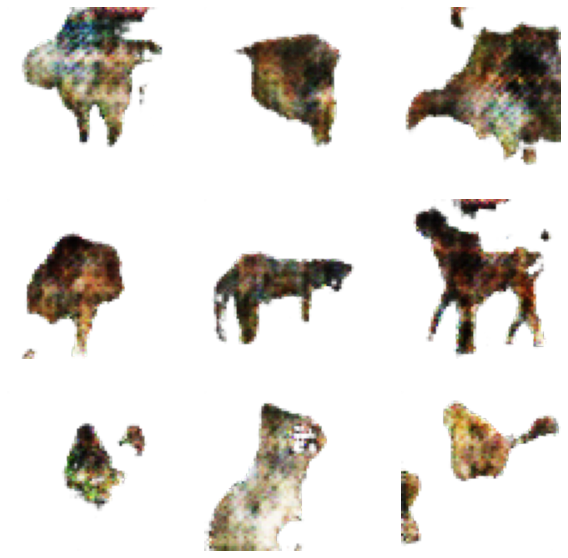

Epoch: 261 Generator loss: 7.855923652648926 Discriminator loss: 0.08858950436115265
Epoch: 262 Generator loss: 1.6386162042617798 Discriminator loss: 0.4818914830684662
Epoch: 263 Generator loss: 2.7226037979125977 Discriminator loss: 0.1942589432001114
Epoch: 264 Generator loss: 4.585660934448242 Discriminator loss: 0.03289242088794708
Epoch: 265 Generator loss: 5.842950820922852 Discriminator loss: 0.04674375802278519
Epoch: 266 Generator loss: 8.588608741760254 Discriminator loss: 0.03955114260315895
Epoch: 267 Generator loss: 4.056129455566406 Discriminator loss: 0.061073318123817444
Epoch: 268 Generator loss: 4.593879222869873 Discriminator loss: 0.2454126477241516
Epoch: 269 Generator loss: 5.176023006439209 Discriminator loss: 0.08566047996282578
Epoch: 270 Generator loss: 3.041769504547119 Discriminator loss: 0.134581059217453


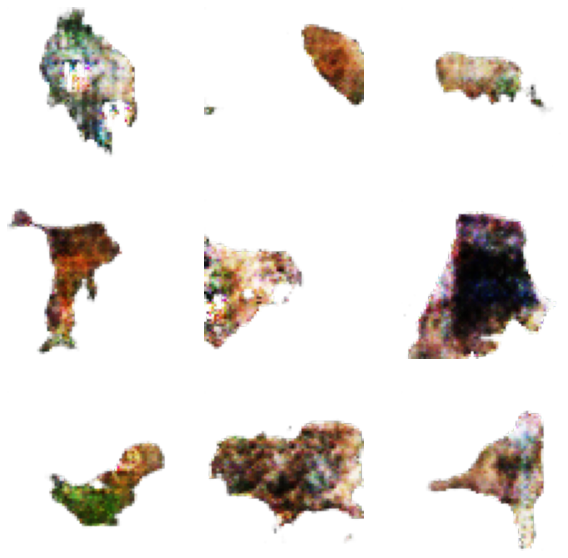

Epoch: 271 Generator loss: 2.940218448638916 Discriminator loss: 0.15111640095710754
Epoch: 272 Generator loss: 5.099178314208984 Discriminator loss: 0.03222683444619179
Epoch: 273 Generator loss: 3.188450813293457 Discriminator loss: 0.1281004101037979
Epoch: 274 Generator loss: 6.7939982414245605 Discriminator loss: 0.1701802760362625
Epoch: 275 Generator loss: 7.400537014007568 Discriminator loss: 0.22451500594615936
Epoch: 276 Generator loss: 3.4705867767333984 Discriminator loss: 0.08982101082801819
Epoch: 277 Generator loss: 3.924011468887329 Discriminator loss: 0.0761454701423645
Epoch: 278 Generator loss: 0.4300260841846466 Discriminator loss: 1.7986339330673218
Epoch: 279 Generator loss: 7.632723808288574 Discriminator loss: 0.027914348989725113
Epoch: 280 Generator loss: 4.273486614227295 Discriminator loss: 0.06266245245933533


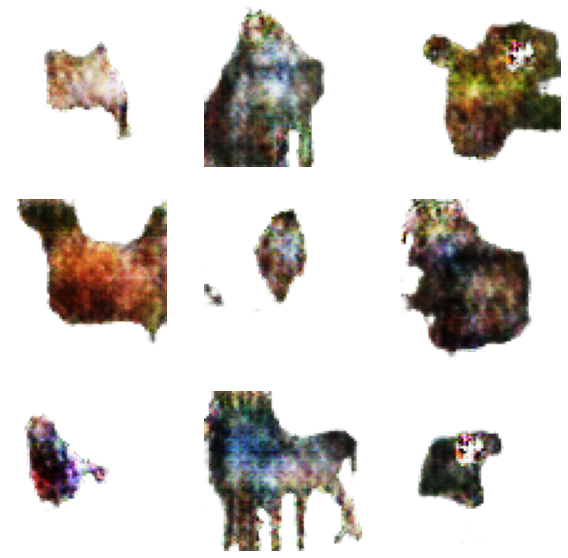

Epoch: 281 Generator loss: 9.345980644226074 Discriminator loss: 1.4603527784347534
Epoch: 282 Generator loss: 2.9066410064697266 Discriminator loss: 0.18367430567741394
Epoch: 283 Generator loss: 4.27483606338501 Discriminator loss: 0.11795209348201752
Epoch: 284 Generator loss: 5.958046913146973 Discriminator loss: 0.06792359054088593
Epoch: 285 Generator loss: 7.447559833526611 Discriminator loss: 0.20782026648521423
Epoch: 286 Generator loss: 7.546168804168701 Discriminator loss: 0.3243493437767029
Epoch: 287 Generator loss: 2.467998743057251 Discriminator loss: 0.20339369773864746
Epoch: 288 Generator loss: 4.780550003051758 Discriminator loss: 0.11166954785585403
Epoch: 289 Generator loss: 5.665924072265625 Discriminator loss: 0.08563186973333359
Epoch: 290 Generator loss: 5.977835655212402 Discriminator loss: 0.027038268744945526


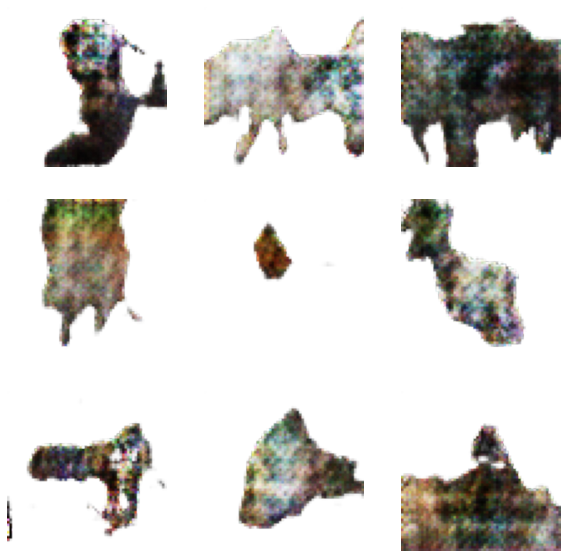

Epoch: 291 Generator loss: 1.809235692024231 Discriminator loss: 0.3748508095741272
Epoch: 292 Generator loss: 3.9292545318603516 Discriminator loss: 0.06214962154626846
Epoch: 293 Generator loss: 4.155831336975098 Discriminator loss: 0.08001181483268738
Epoch: 294 Generator loss: 0.8669336438179016 Discriminator loss: 1.1028382778167725
Epoch: 295 Generator loss: 2.230839252471924 Discriminator loss: 0.23344600200653076
Epoch: 296 Generator loss: 3.106281042098999 Discriminator loss: 0.11815476417541504
Epoch: 297 Generator loss: 4.232911109924316 Discriminator loss: 0.08105476200580597
Epoch: 298 Generator loss: 3.312206506729126 Discriminator loss: 0.07889336347579956
Epoch: 299 Generator loss: 7.6841139793396 Discriminator loss: 0.15087144076824188
Epoch: 300 Generator loss: 5.444847583770752 Discriminator loss: 0.016224989667534828


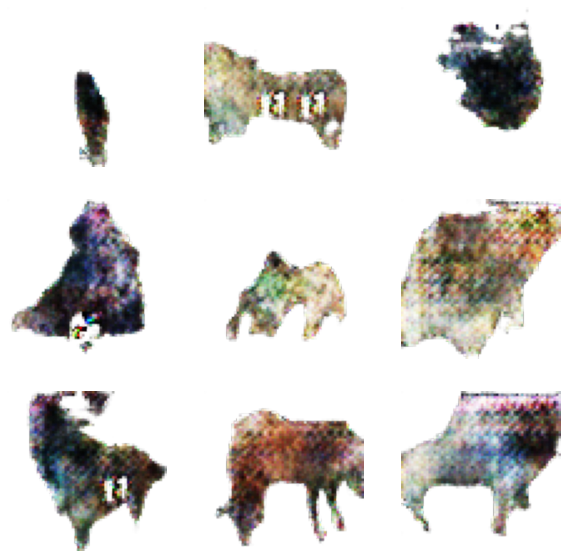

Epoch: 301 Generator loss: 5.302675724029541 Discriminator loss: 0.0225831251591444
Epoch: 302 Generator loss: 6.261055946350098 Discriminator loss: 0.09808413684368134
Epoch: 303 Generator loss: 8.094830513000488 Discriminator loss: 0.4990200102329254
Epoch: 304 Generator loss: 6.2487568855285645 Discriminator loss: 0.04120573401451111
Epoch: 305 Generator loss: 5.565597057342529 Discriminator loss: 0.012881413102149963
Epoch: 306 Generator loss: 3.927227735519409 Discriminator loss: 0.1323036253452301
Epoch: 307 Generator loss: 4.83358097076416 Discriminator loss: 0.0434303879737854
Epoch: 308 Generator loss: 8.491158485412598 Discriminator loss: 0.09201867133378983
Epoch: 309 Generator loss: 2.8228635787963867 Discriminator loss: 0.18113726377487183
Epoch: 310 Generator loss: 3.8828985691070557 Discriminator loss: 0.10955113917589188


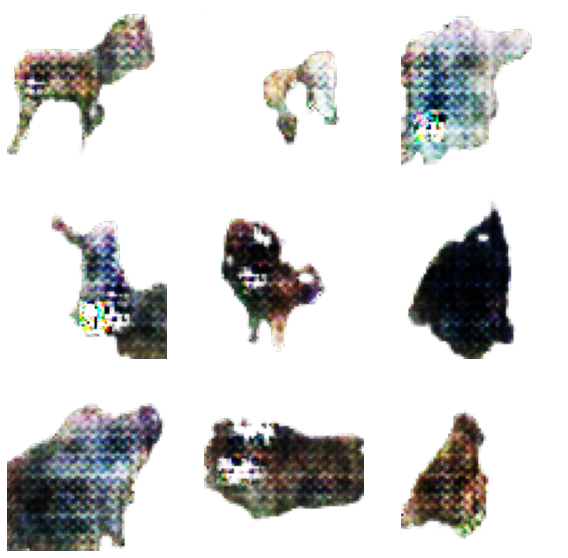

Epoch: 311 Generator loss: 2.563444137573242 Discriminator loss: 0.1874895989894867
Epoch: 312 Generator loss: 8.23725700378418 Discriminator loss: 0.34806469082832336
Epoch: 313 Generator loss: 8.248058319091797 Discriminator loss: 0.24511682987213135
Epoch: 314 Generator loss: 6.784112930297852 Discriminator loss: 0.011521222069859505
Epoch: 315 Generator loss: 3.1366283893585205 Discriminator loss: 0.15568313002586365
Epoch: 316 Generator loss: 5.185656547546387 Discriminator loss: 0.10702180117368698
Epoch: 317 Generator loss: 4.611361503601074 Discriminator loss: 0.05602921545505524
Epoch: 318 Generator loss: 5.469810962677002 Discriminator loss: 0.04199768602848053
Epoch: 319 Generator loss: 4.400287628173828 Discriminator loss: 0.03798539936542511
Epoch: 320 Generator loss: 6.609683990478516 Discriminator loss: 0.021551400423049927


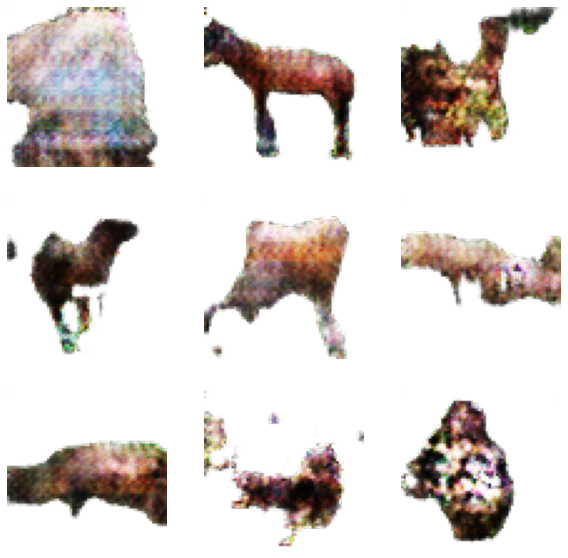

Epoch: 321 Generator loss: 1.606553077697754 Discriminator loss: 0.4593413472175598
Epoch: 322 Generator loss: 1.474453091621399 Discriminator loss: 0.6361772418022156
Epoch: 323 Generator loss: 2.648531913757324 Discriminator loss: 0.29183727502822876
Epoch: 324 Generator loss: 3.0680947303771973 Discriminator loss: 0.14157041907310486
Epoch: 325 Generator loss: 4.565333366394043 Discriminator loss: 0.0395420677959919
Epoch: 326 Generator loss: 3.7701659202575684 Discriminator loss: 0.11120709776878357
Epoch: 327 Generator loss: 4.881433010101318 Discriminator loss: 0.025936294347047806
Epoch: 328 Generator loss: 11.320661544799805 Discriminator loss: 0.8376188278198242
Epoch: 329 Generator loss: 6.345733165740967 Discriminator loss: 0.019682373851537704
Epoch: 330 Generator loss: 6.997043609619141 Discriminator loss: 0.022614166140556335


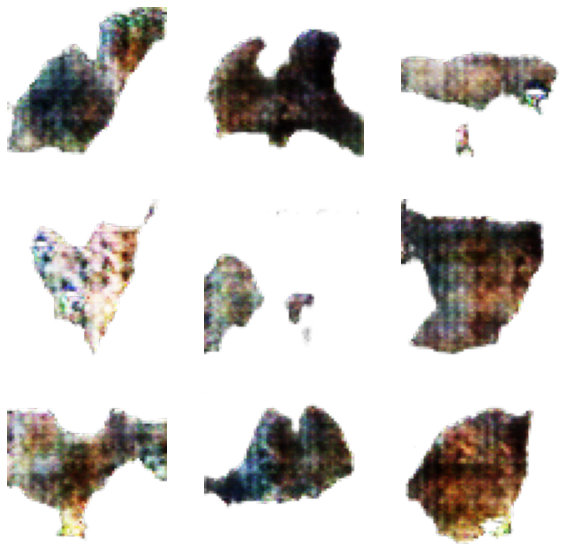

Epoch: 331 Generator loss: 5.006808280944824 Discriminator loss: 0.05564836412668228
Epoch: 332 Generator loss: 13.908797264099121 Discriminator loss: 3.905027151107788
Epoch: 333 Generator loss: 2.2308309078216553 Discriminator loss: 0.2953433692455292
Epoch: 334 Generator loss: 5.268810272216797 Discriminator loss: 0.02934863790869713
Epoch: 335 Generator loss: 3.986114263534546 Discriminator loss: 0.039858993142843246
Epoch: 336 Generator loss: 4.026526927947998 Discriminator loss: 0.06561516970396042
Epoch: 337 Generator loss: 12.487500190734863 Discriminator loss: 1.8295619487762451
Epoch: 338 Generator loss: 1.6648399829864502 Discriminator loss: 0.4651213586330414
Epoch: 339 Generator loss: 6.149652481079102 Discriminator loss: 0.42759692668914795
Epoch: 340 Generator loss: 5.711036205291748 Discriminator loss: 0.05361088365316391


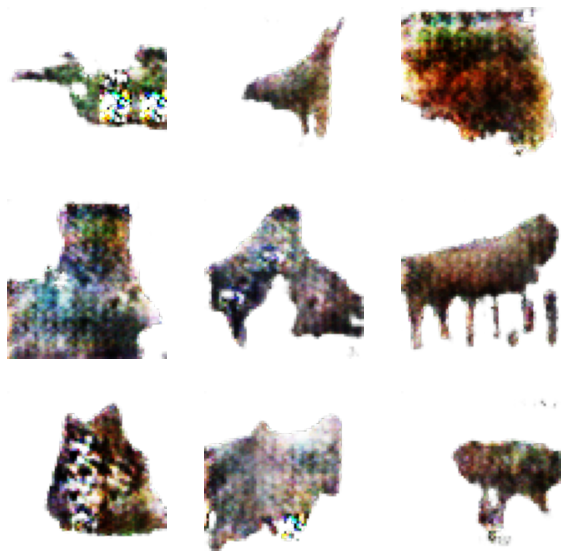

Epoch: 341 Generator loss: 3.8400516510009766 Discriminator loss: 0.06478210538625717
Epoch: 342 Generator loss: 7.203210353851318 Discriminator loss: 0.05694771185517311
Epoch: 343 Generator loss: 8.133431434631348 Discriminator loss: 0.8541054129600525
Epoch: 344 Generator loss: 3.6317367553710938 Discriminator loss: 0.06702740490436554
Epoch: 345 Generator loss: 7.197281360626221 Discriminator loss: 0.03480030968785286
Epoch: 346 Generator loss: 4.335860729217529 Discriminator loss: 0.04451455548405647
Epoch: 347 Generator loss: 7.136338710784912 Discriminator loss: 0.1820755898952484
Epoch: 348 Generator loss: 7.3967437744140625 Discriminator loss: 0.2560262978076935
Epoch: 349 Generator loss: 9.027249336242676 Discriminator loss: 0.09812232106924057
Epoch: 350 Generator loss: 4.521618366241455 Discriminator loss: 0.032536063343286514


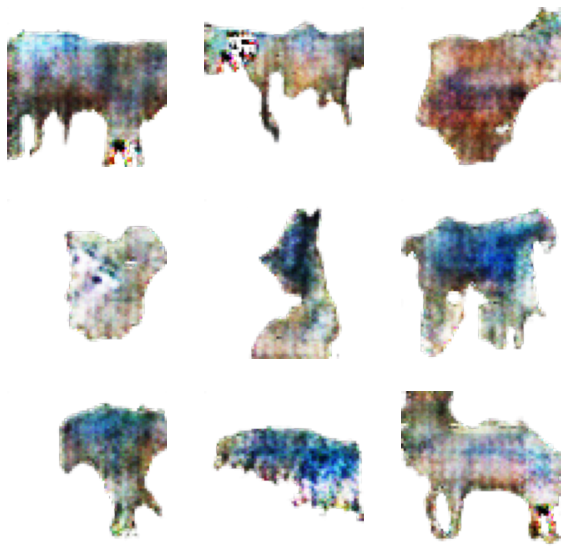

Epoch: 351 Generator loss: 5.76016092300415 Discriminator loss: 0.04554462805390358
Epoch: 352 Generator loss: 5.057639122009277 Discriminator loss: 0.24596723914146423
Epoch: 353 Generator loss: 5.375741004943848 Discriminator loss: 0.03655843064188957
Epoch: 354 Generator loss: 3.5838403701782227 Discriminator loss: 0.1778627634048462
Epoch: 355 Generator loss: 9.702814102172852 Discriminator loss: 1.1780643463134766
Epoch: 356 Generator loss: 7.0204057693481445 Discriminator loss: 0.04512514919042587
Epoch: 357 Generator loss: 2.8715341091156006 Discriminator loss: 0.18884581327438354
Epoch: 358 Generator loss: 9.51455307006836 Discriminator loss: 0.3230149447917938
Epoch: 359 Generator loss: 3.0251271724700928 Discriminator loss: 0.15408311784267426
Epoch: 360 Generator loss: 3.9765143394470215 Discriminator loss: 0.051295213401317596


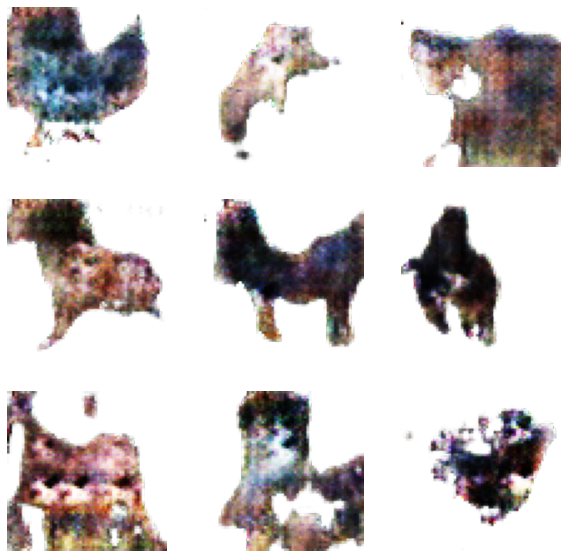

Epoch: 361 Generator loss: 1.9284214973449707 Discriminator loss: 0.3851092457771301
Epoch: 362 Generator loss: 10.655628204345703 Discriminator loss: 2.1528806686401367
Epoch: 363 Generator loss: 3.283581256866455 Discriminator loss: 0.11447910219430923
Epoch: 364 Generator loss: 2.2450573444366455 Discriminator loss: 0.31337180733680725
Epoch: 365 Generator loss: 5.1916704177856445 Discriminator loss: 0.051094137132167816
Epoch: 366 Generator loss: 1.3472121953964233 Discriminator loss: 0.6019321084022522
Epoch: 367 Generator loss: 0.5443006753921509 Discriminator loss: 1.639635443687439
Epoch: 368 Generator loss: 5.008789539337158 Discriminator loss: 0.07160300016403198
Epoch: 369 Generator loss: 11.223518371582031 Discriminator loss: 0.7979523539543152
Epoch: 370 Generator loss: 2.413536787033081 Discriminator loss: 0.24627335369586945


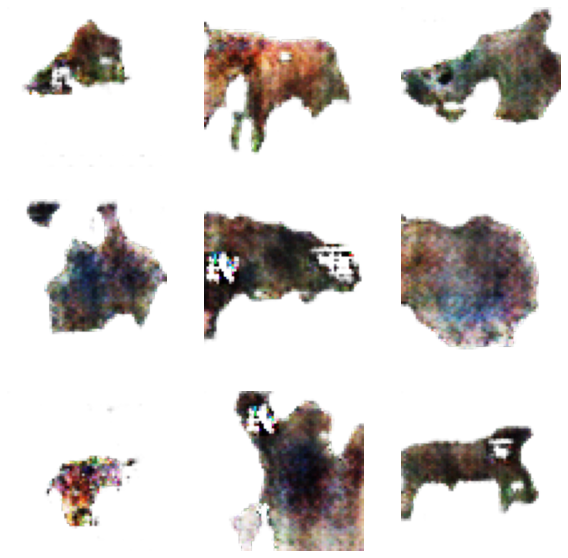

Epoch: 371 Generator loss: 7.292529106140137 Discriminator loss: 0.06250298768281937
Epoch: 372 Generator loss: 8.161044120788574 Discriminator loss: 0.042979612946510315
Epoch: 373 Generator loss: 4.945648670196533 Discriminator loss: 0.03504026681184769
Epoch: 374 Generator loss: 1.241199016571045 Discriminator loss: 0.714616596698761
Epoch: 375 Generator loss: 3.9423751831054688 Discriminator loss: 0.06516473740339279
Epoch: 376 Generator loss: 2.032130479812622 Discriminator loss: 0.30426013469696045
Epoch: 377 Generator loss: 1.7949713468551636 Discriminator loss: 0.43098583817481995
Epoch: 378 Generator loss: 5.958823204040527 Discriminator loss: 0.10909221321344376
Epoch: 379 Generator loss: 4.9247541427612305 Discriminator loss: 0.033339619636535645
Epoch: 380 Generator loss: 9.350519180297852 Discriminator loss: 0.2205418050289154


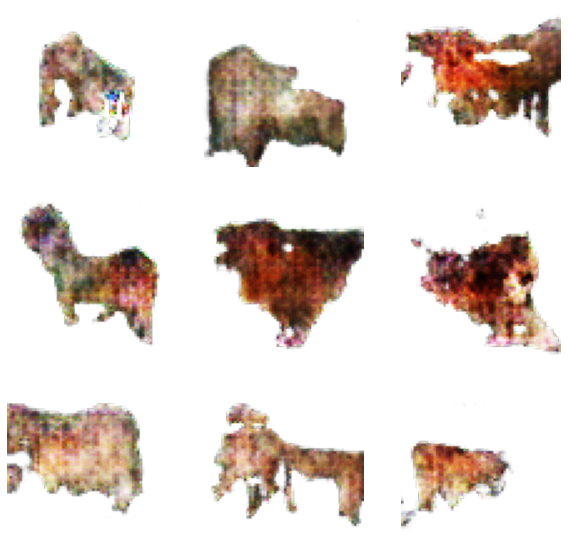

Epoch: 381 Generator loss: 1.6430314779281616 Discriminator loss: 0.5045404434204102
Epoch: 382 Generator loss: 5.708376407623291 Discriminator loss: 0.030178319662809372
Epoch: 383 Generator loss: 6.183767318725586 Discriminator loss: 0.043411098420619965
Epoch: 384 Generator loss: 5.720005512237549 Discriminator loss: 0.06052498519420624
Epoch: 385 Generator loss: 6.41192626953125 Discriminator loss: 0.12561818957328796
Epoch: 386 Generator loss: 5.56728982925415 Discriminator loss: 0.062189891934394836
Epoch: 387 Generator loss: 2.8242440223693848 Discriminator loss: 0.2998054623603821
Epoch: 388 Generator loss: 0.13624712824821472 Discriminator loss: 2.88672137260437
Epoch: 389 Generator loss: 0.7296627759933472 Discriminator loss: 1.106502652168274
Epoch: 390 Generator loss: 4.467214107513428 Discriminator loss: 0.0531257688999176


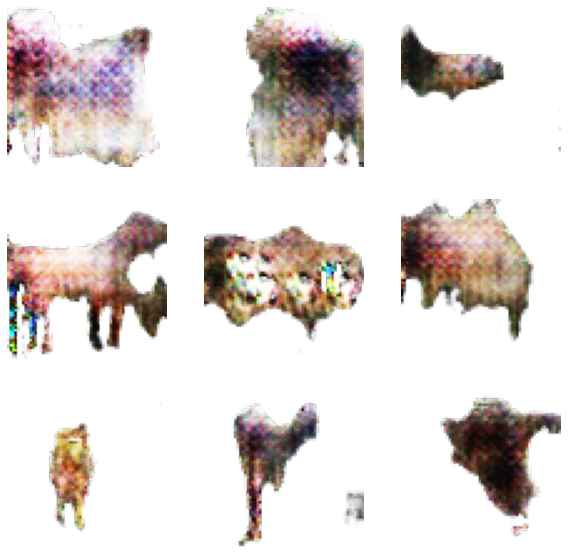

Epoch: 391 Generator loss: 0.320407897233963 Discriminator loss: 2.1040992736816406
Epoch: 392 Generator loss: 4.255334854125977 Discriminator loss: 0.051788438111543655
Epoch: 393 Generator loss: 6.587753772735596 Discriminator loss: 0.03908877074718475
Epoch: 394 Generator loss: 3.9022154808044434 Discriminator loss: 0.2150920331478119
Epoch: 395 Generator loss: 4.868438720703125 Discriminator loss: 0.09140485525131226
Epoch: 396 Generator loss: 2.4731805324554443 Discriminator loss: 0.19299004971981049
Epoch: 397 Generator loss: 2.8053438663482666 Discriminator loss: 0.16493406891822815
Epoch: 398 Generator loss: 8.290933609008789 Discriminator loss: 0.02229609712958336
Epoch: 399 Generator loss: 9.325118064880371 Discriminator loss: 0.24137957394123077
Epoch: 400 Generator loss: 8.49368667602539 Discriminator loss: 0.0800720825791359


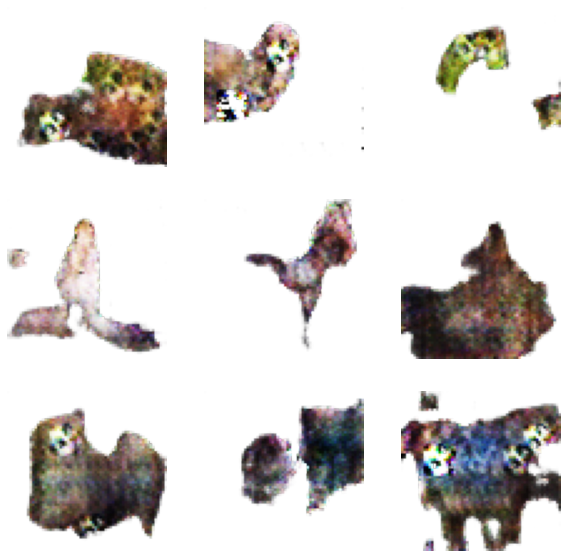

Epoch: 401 Generator loss: 7.114025115966797 Discriminator loss: 0.025340311229228973
Epoch: 402 Generator loss: 8.080516815185547 Discriminator loss: 0.12451168894767761
Epoch: 403 Generator loss: 3.688775062561035 Discriminator loss: 0.09445079416036606
Epoch: 404 Generator loss: 7.514285087585449 Discriminator loss: 0.00713325897231698
Epoch: 405 Generator loss: 3.586055040359497 Discriminator loss: 0.11840873956680298
Epoch: 406 Generator loss: 7.416813373565674 Discriminator loss: 0.019659603014588356
Epoch: 407 Generator loss: 3.0434980392456055 Discriminator loss: 0.14134491980075836
Epoch: 408 Generator loss: 0.20068514347076416 Discriminator loss: 2.567575216293335
Epoch: 409 Generator loss: 5.139244556427002 Discriminator loss: 0.025855906307697296
Epoch: 410 Generator loss: 4.030229568481445 Discriminator loss: 0.09149836748838425


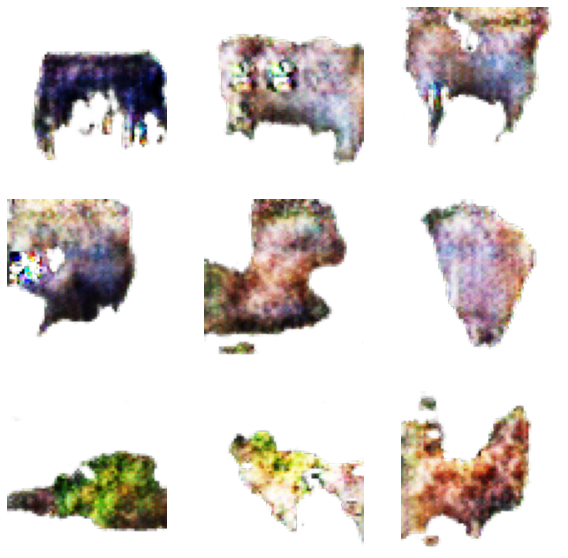

Epoch: 411 Generator loss: 8.311188697814941 Discriminator loss: 0.05289718508720398
Epoch: 412 Generator loss: 5.488026142120361 Discriminator loss: 0.14506907761096954
Epoch: 413 Generator loss: 7.635112762451172 Discriminator loss: 0.1039823368191719
Epoch: 414 Generator loss: 5.160686492919922 Discriminator loss: 0.026390332728624344
Epoch: 415 Generator loss: 5.937236785888672 Discriminator loss: 0.3291749954223633
Epoch: 416 Generator loss: 6.223094940185547 Discriminator loss: 0.010853417217731476
Epoch: 417 Generator loss: 4.884917736053467 Discriminator loss: 0.07808755338191986
Epoch: 418 Generator loss: 7.076399326324463 Discriminator loss: 0.07113543152809143
Epoch: 419 Generator loss: 4.829151153564453 Discriminator loss: 0.04592017084360123
Epoch: 420 Generator loss: 3.12471342086792 Discriminator loss: 0.13825130462646484


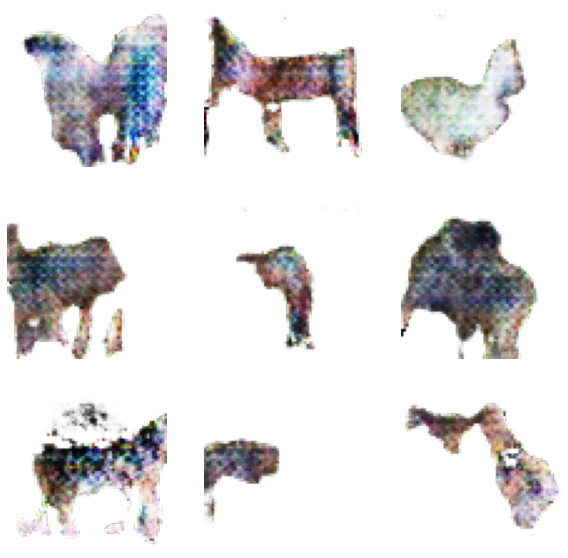

Epoch: 421 Generator loss: 3.614297389984131 Discriminator loss: 0.13695791363716125
Epoch: 422 Generator loss: 9.689486503601074 Discriminator loss: 0.2776085436344147
Epoch: 423 Generator loss: 5.529818534851074 Discriminator loss: 0.011701568961143494
Epoch: 424 Generator loss: 8.47944450378418 Discriminator loss: 0.06221826374530792
Epoch: 425 Generator loss: 6.398942947387695 Discriminator loss: 0.020054709166288376
Epoch: 426 Generator loss: 7.335383892059326 Discriminator loss: 0.07632402330636978
Epoch: 427 Generator loss: 6.49734354019165 Discriminator loss: 0.10127172619104385
Epoch: 428 Generator loss: 4.549572944641113 Discriminator loss: 0.08019315451383591
Epoch: 429 Generator loss: 3.391066551208496 Discriminator loss: 0.10085464268922806
Epoch: 430 Generator loss: 5.1336565017700195 Discriminator loss: 0.09491629153490067


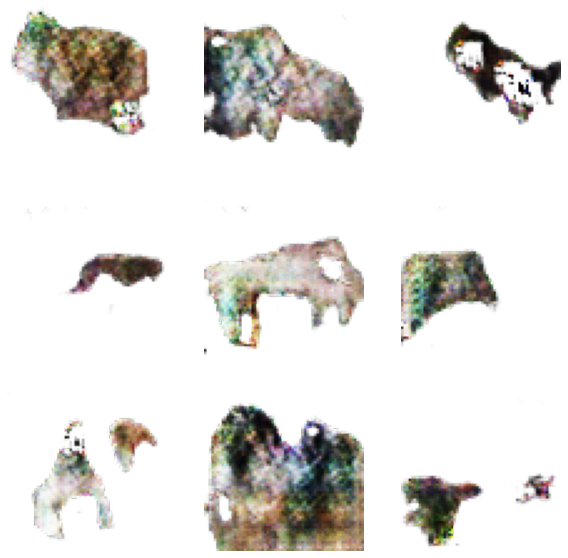

Epoch: 431 Generator loss: 6.915316581726074 Discriminator loss: 0.15157341957092285
Epoch: 432 Generator loss: 3.165377140045166 Discriminator loss: 0.11700910329818726
Epoch: 433 Generator loss: 1.3384567499160767 Discriminator loss: 0.5995820164680481
Epoch: 434 Generator loss: 3.774685859680176 Discriminator loss: 0.07411504536867142
Epoch: 435 Generator loss: 1.723942756652832 Discriminator loss: 0.4771832227706909
Epoch: 436 Generator loss: 6.490522861480713 Discriminator loss: 0.08254837244749069
Epoch: 437 Generator loss: 2.7446396350860596 Discriminator loss: 0.16278855502605438
Epoch: 438 Generator loss: 6.1051483154296875 Discriminator loss: 0.032879333943128586
Epoch: 439 Generator loss: 0.21325671672821045 Discriminator loss: 2.6490440368652344
Epoch: 440 Generator loss: 4.068696975708008 Discriminator loss: 0.06349600106477737


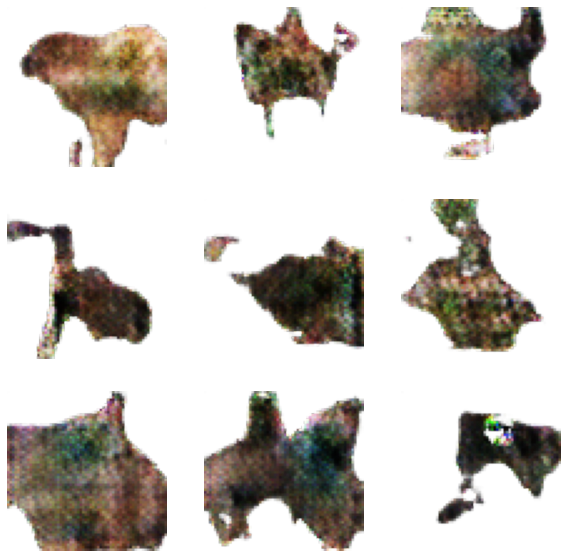

Epoch: 441 Generator loss: 3.5282247066497803 Discriminator loss: 0.11041736602783203
Epoch: 442 Generator loss: 4.517395496368408 Discriminator loss: 0.05979567766189575
Epoch: 443 Generator loss: 3.7447125911712646 Discriminator loss: 0.07695797085762024
Epoch: 444 Generator loss: 7.1656341552734375 Discriminator loss: 0.6472064852714539
Epoch: 445 Generator loss: 6.67337703704834 Discriminator loss: 0.05239544063806534
Epoch: 446 Generator loss: 6.738446235656738 Discriminator loss: 0.022888973355293274
Epoch: 447 Generator loss: 6.738626003265381 Discriminator loss: 0.016113178804516792
Epoch: 448 Generator loss: 1.9913924932479858 Discriminator loss: 0.34382086992263794
Epoch: 449 Generator loss: 7.594390869140625 Discriminator loss: 0.05505913496017456
Epoch: 450 Generator loss: 1.9524585008621216 Discriminator loss: 0.3329281508922577


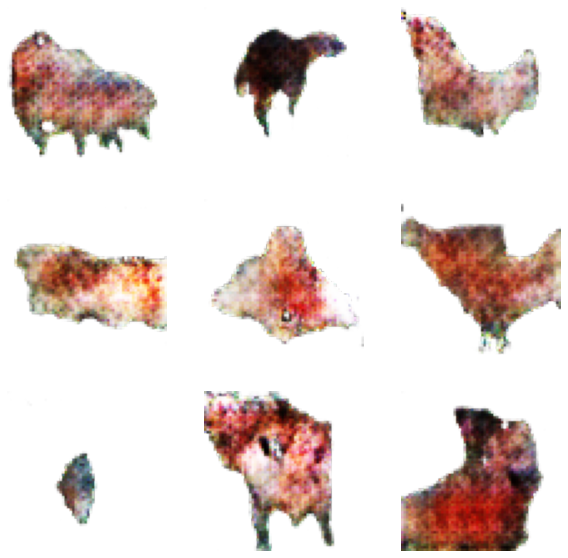

Epoch: 451 Generator loss: 4.388628005981445 Discriminator loss: 0.04900394007563591
Epoch: 452 Generator loss: 5.874425888061523 Discriminator loss: 0.04278690367937088
Epoch: 453 Generator loss: 8.865885734558105 Discriminator loss: 0.15070804953575134
Epoch: 454 Generator loss: 1.7045063972473145 Discriminator loss: 0.5203437805175781
Epoch: 455 Generator loss: 6.604716777801514 Discriminator loss: 0.07389268279075623
Epoch: 456 Generator loss: 3.917888879776001 Discriminator loss: 0.07557830214500427
Epoch: 457 Generator loss: 3.774672508239746 Discriminator loss: 0.056791674345731735
Epoch: 458 Generator loss: 5.963535785675049 Discriminator loss: 0.04681362956762314
Epoch: 459 Generator loss: 7.357369422912598 Discriminator loss: 0.05874469503760338
Epoch: 460 Generator loss: 4.917254447937012 Discriminator loss: 0.13467003405094147


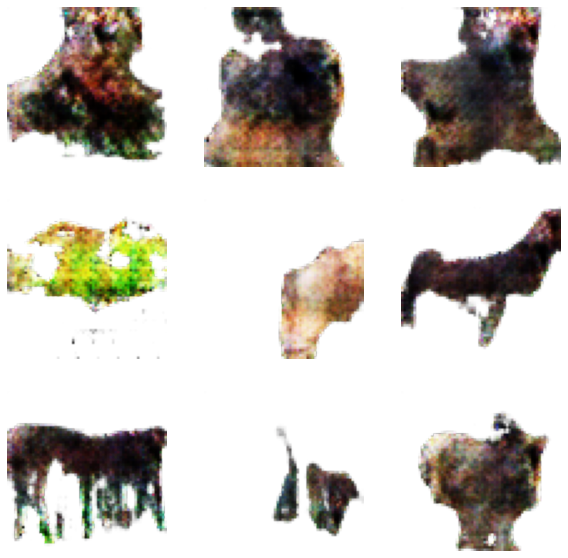

Epoch: 461 Generator loss: 0.9026404023170471 Discriminator loss: 1.04490327835083
Epoch: 462 Generator loss: 7.050260066986084 Discriminator loss: 0.08664873242378235
Epoch: 463 Generator loss: 10.993464469909668 Discriminator loss: 0.05441489815711975
Epoch: 464 Generator loss: 4.245006561279297 Discriminator loss: 0.05400489643216133
Epoch: 465 Generator loss: 2.7963836193084717 Discriminator loss: 0.15872986614704132
Epoch: 466 Generator loss: 3.1472890377044678 Discriminator loss: 0.100810706615448
Epoch: 467 Generator loss: 5.641420841217041 Discriminator loss: 0.025524910539388657
Epoch: 468 Generator loss: 6.496197700500488 Discriminator loss: 0.0668332427740097
Epoch: 469 Generator loss: 13.453930854797363 Discriminator loss: 0.3848946988582611
Epoch: 470 Generator loss: 8.680693626403809 Discriminator loss: 0.07652218639850616


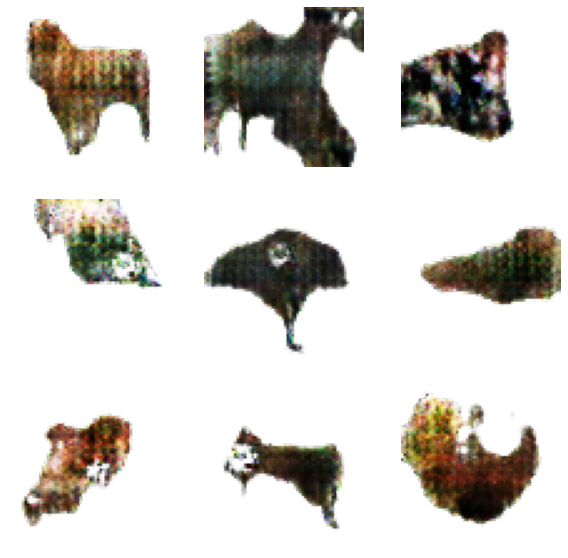

Epoch: 471 Generator loss: 1.3730887174606323 Discriminator loss: 0.6827518939971924
Epoch: 472 Generator loss: 4.434004783630371 Discriminator loss: 0.045272842049598694
Epoch: 473 Generator loss: 7.354223251342773 Discriminator loss: 0.005876399576663971
Epoch: 474 Generator loss: 5.601192474365234 Discriminator loss: 0.0430716797709465
Epoch: 475 Generator loss: 4.036112308502197 Discriminator loss: 0.06965690106153488
Epoch: 476 Generator loss: 5.728164196014404 Discriminator loss: 0.04215466231107712
Epoch: 477 Generator loss: 3.8750088214874268 Discriminator loss: 0.06695306301116943
Epoch: 478 Generator loss: 5.5517168045043945 Discriminator loss: 0.026444952934980392
Epoch: 479 Generator loss: 6.8841681480407715 Discriminator loss: 0.041031595319509506
Epoch: 480 Generator loss: 6.040727615356445 Discriminator loss: 0.06106365844607353


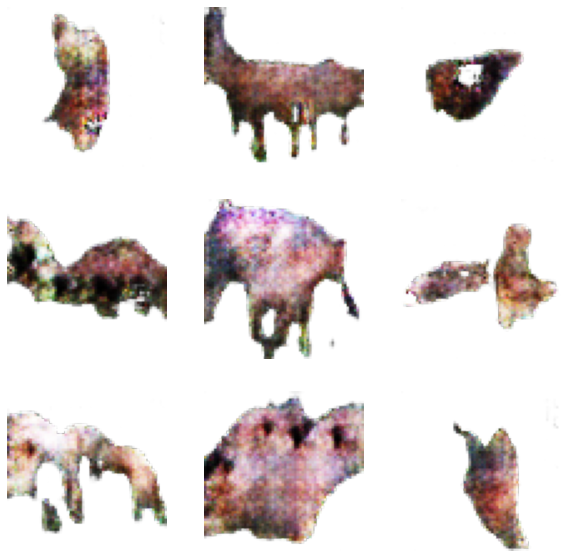

Epoch: 481 Generator loss: 5.671552658081055 Discriminator loss: 0.03558424860239029
Epoch: 482 Generator loss: 5.247815132141113 Discriminator loss: 0.05872911959886551
Epoch: 483 Generator loss: 4.423390865325928 Discriminator loss: 0.05059223994612694
Epoch: 484 Generator loss: 7.019972324371338 Discriminator loss: 0.02823822759091854
Epoch: 485 Generator loss: 5.202584743499756 Discriminator loss: 0.07499437034130096
Epoch: 486 Generator loss: 10.102381706237793 Discriminator loss: 0.38739344477653503
Epoch: 487 Generator loss: 8.974679946899414 Discriminator loss: 0.0618257038295269
Epoch: 488 Generator loss: 9.071249008178711 Discriminator loss: 0.08092821389436722
Epoch: 489 Generator loss: 3.3586199283599854 Discriminator loss: 0.1499527245759964
Epoch: 490 Generator loss: 4.682103633880615 Discriminator loss: 0.06391354650259018


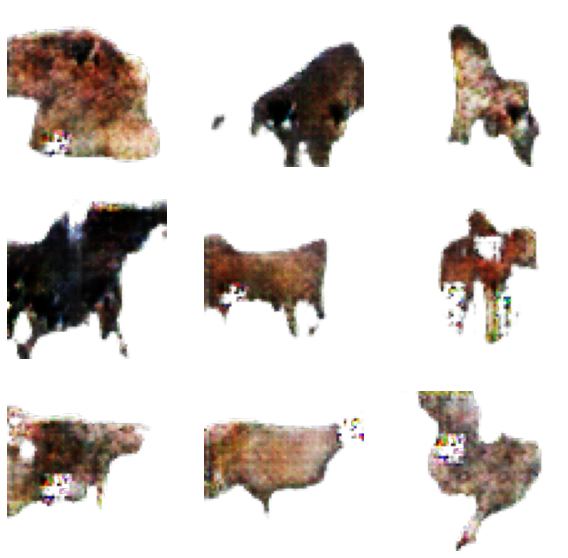

Epoch: 491 Generator loss: 5.695955753326416 Discriminator loss: 0.07303433120250702
Epoch: 492 Generator loss: 11.470353126525879 Discriminator loss: 1.4964545965194702
Epoch: 493 Generator loss: 3.1211681365966797 Discriminator loss: 0.2067904770374298
Epoch: 494 Generator loss: 4.94001579284668 Discriminator loss: 0.035831354558467865
Epoch: 495 Generator loss: 7.1295599937438965 Discriminator loss: 0.004180229268968105
Epoch: 496 Generator loss: 4.445792198181152 Discriminator loss: 0.04129324108362198
Epoch: 497 Generator loss: 3.891500473022461 Discriminator loss: 0.11602391302585602
Epoch: 498 Generator loss: 3.9376277923583984 Discriminator loss: 0.08697227388620377
Epoch: 499 Generator loss: 4.721029758453369 Discriminator loss: 0.13040028512477875
Epoch: 500 Generator loss: 8.079922676086426 Discriminator loss: 0.01856582798063755


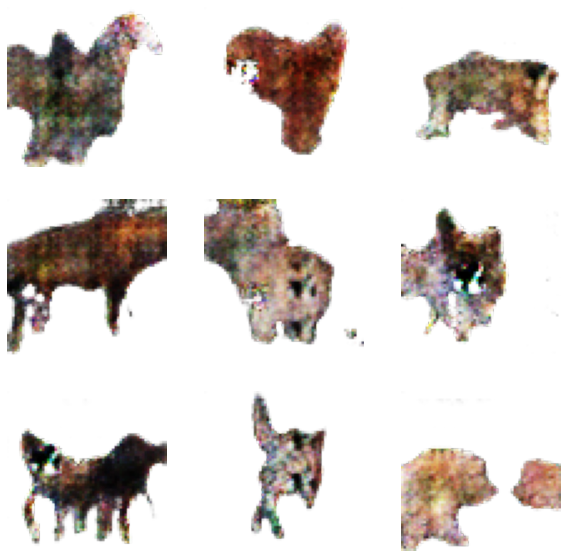

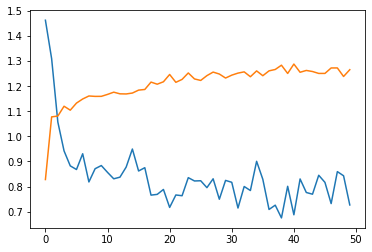

In [10]:
# Set the values for number of channels, noise size, learning rate and beta_1
noise_size = 100
channels = 4
learning_rate = 0.0001
beta_1 = 0.5
epoch_num=500
batch_s=100

# Create generators, optimizers, and checkpoints
generator, generator_optimizer, generator_checkpoint = create_generator(channels, noise_size, learning_rate, beta_1)
# Create discriminators, optimizers, and checkpoints
discriminator, discriminator_optimizer, discriminator_checkpoint = create_discriminator(channels, learning_rate, beta_1)

# Train the DCGAN
train_DCGAN(train_set, batch_size=batch_s, epochs=epoch_num)

In [11]:
# Load the index of a checkpoint
checkpoint_dir="/content/generator/ckpt-50"
# from the DCGAN tutorial
checkpoint = tf.train.Checkpoint(
    generator_optimizer=generator_optimizer,
    discriminator_optimizer=discriminator_optimizer,
    generator=generator,
    discriminator=discriminator,
)

latest = tf.train.latest_checkpoint(checkpoint_dir)
checkpoint.restore(latest)

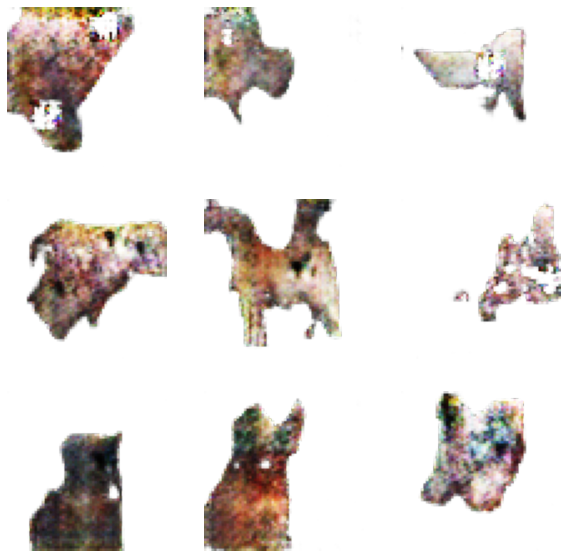

In [12]:
# generate an image
noise1 = tf.random.normal([100, noise_size])
prediction= checkpoint.generator(noise1)

fig = plt.figure(figsize=(10, 10))

for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(prediction[i])
    plt.axis('off')

plt.show()

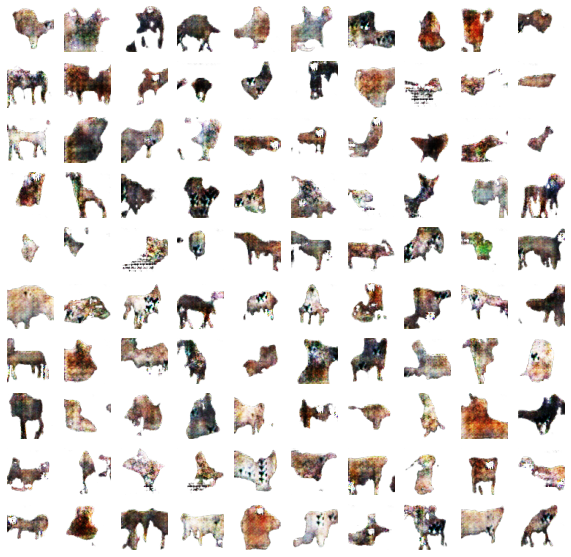

In [13]:
# Randomly plot 100 generated creatures
noise = tf.random.normal([100, noise_size])
prediction = generator(noise, training=False)
fig = plt.figure(figsize=(10, 10))

for i in range(100):
    plt.subplot(10, 10, i + 1)
    plt.imshow(prediction[i])
    plt.axis('off')

plt.show()

In [ ]:
# Randomly plot 100 generated creatures
for i in range(1000):
    noise = tf.random.normal([1, noise_size])
    prediction = generator(noise, training=False)
    plt.imshow(prediction[0])
    plt.axis('off')
    plt.savefig('/content/generatedimgs1/%i.png' % i)

In [22]:
# Calculate Inception Score
from math import floor
from numpy import ones
from numpy import expand_dims
from numpy import log
from numpy import mean
from numpy import std
from numpy import exp
from numpy.random import shuffle
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input
from keras.datasets import cifar10
from skimage.transform import resize
from numpy import asarray
 
# scale an array of images to a new size
def scale_images(images, new_shape):
	images_list = list()
	for image in images:
		# resize with nearest neighbor interpolation
		new_image = resize(image, new_shape, 0)
		# store
		images_list.append(new_image)
	return asarray(images_list)
 
# assumes images have any shape and pixels in [0,255]
def calculate_inception_score(images, n_split=10, eps=1E-16):
	# load inception v3 model
	model = InceptionV3()
	# enumerate splits of images/predictions
	scores = list()
	n_part = floor(images.shape[0] / n_split)
	for i in range(n_split):
		# retrieve images
		ix_start, ix_end = i * n_part, (i+1) * n_part
		subset = images[ix_start:ix_end]
		# convert from uint8 to float32
		subset = subset.astype('float32')
		# scale images to the required size
		subset = scale_images(subset, (299,299,3))
		# pre-process images, scale to [-1,1]
		subset = preprocess_input(subset)
		# predict p(y|x)
		p_yx = model.predict(subset)
		# calculate p(y)
		p_y = expand_dims(p_yx.mean(axis=0), 0)
		# calculate KL divergence using log probabilities
		kl_d = p_yx * (log(p_yx + eps) - log(p_y + eps))
		# sum over classes
		sum_kl_d = kl_d.sum(axis=1)
		# average over images
		avg_kl_d = mean(sum_kl_d)
		# undo the log
		is_score = exp(avg_kl_d)
		# store
		scores.append(is_score)
	# average across images
	is_avg, is_std = mean(scores), std(scores)
	return is_avg, is_std


In [24]:
#Inception Score for preprocessed images
images = []
all_files=["cane","cavallo","elefante","farfalla","gallina","pecora","mucca","ragno","gatto","scoiattolo"]
for files in all_files:
    for image_name in glob.glob("/content/Processed_Imgs2/"+files+"/*.png"):
        image = Image.open(image_name)
        image = np.asarray(image)
        images.append(image)
print('loaded', np.asarray(images).shape)
random.shuffle(images)

# calculate inception score
is_avg, is_std = calculate_inception_score(np.asarray(images))
print('score', is_avg, is_std)

loaded (18894, 64, 64, 4)
score 3.9495082 0.04464717


In [23]:
images = []
for image_name in glob.glob("/content/generatedimgs1/*.png"):
        image = Image.open(image_name)
        image = np.asarray(image)
        images.append(image)
print('loaded', np.asarray(images).shape)
random.shuffle(images)

# calculate inception score
is_avg, is_std = calculate_inception_score(np.asarray(images))
print('score', is_avg, is_std)

loaded (100, 288, 432, 4)
score 1.2678604 0.07831747
